In [1]:
import pandas as pd
import numpy as np

import os 

import matplotlib.pyplot as plt

from pymatgen.core import Structure

from scipy.stats import pearsonr, spearmanr
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap

from FeGB_PtableSeg.plotters import (custom_colors,
                                     gb_latex_dict,
                                     bulk_df,
                                     gb_marker_dict,
                                     get_element_number,
                                     get_element_symbol,
                                     plot_pivot_table,
                                     GB_symmetries,
                                     plot_minEseg_prop_vs_Z,
                                     plot_prop_vs_prop_GB,
                                     plot_prop_vs_prop_with_2d_histograms,
                                     periodic_table_plot,
                                     periodic_table_dual_plot,
                                     plot_x_y_whist_spectra,
                                     plot_prop_vs_prop
)

%load_ext autoreload
%autoreload 2

In [2]:
fig_savepath = "/mnt/c/Users/liger/Koofr/Fe-PtableTrends-Manuscript/"
df = pd.read_pickle("/root/Fe_Ptable_Project/2024_03_25_PublicationPlots/2025_02_26_ptable_Fe_GB_df.pkl.gz", compression="gzip")
# Get rid of unphysical points
df.loc[(df["E_seg"] < -7) | (df["E_seg"] > 2), "E_seg"] = np.nan
df["Z"] = df.element.apply(get_element_number)
symmetries_dict = GB_symmetries().symmetry_dict_all.copy()
df["equivalent_sites"] = [symmetries_dict[row.GB][row.site] for _, row in df.iterrows()]
df["site_multiplicity"] = [len(row.equivalent_sites) for _, row in df.iterrows()]
df["GB_site"] = [row.GB +"-"+str(row.site) for _, row in df.iterrows()]
df.columns

Index(['job_name', 'structure', 'GB', 'element', 'site', 'Z', 'E_seg',
       'magmoms', 'convergence', 'GB_site', 'structure_unrel', 'E_seg_unrel',
       'magmoms_unrel', 'DDEC6_ANSBO_atomic_layers',
       'DDEC6_ANSBO_cleavage_coords', 'DDEC6_ANSBO_profile',
       'DDEC6_ANSBO_within_range', 'DDEC6_min_ANSBO', 'pure_ca_results',
       'pure_DDEC6_ANSBO_atomic_layers', 'pure_DDEC6_ANSBO_cleavage_coords',
       'pure_DDEC6_ANSBO_profile', 'pure_DDEC6_ANSBO_within_range',
       'pure_DDEC6_min_ANSBO', 'total_energy', 'convergence_pureGB',
       'total_energy_pureGB', 'magmoms_pureGB', 'GB_element_site',
       'Wsep_RGS_list', 'cleavage_planes', 'cp_names', 'Wsep_RGS_min',
       'pure_cleavage_planes', 'pure_cleavage_energies', 'pure_min_wsep_rigid',
       'site_z', 'solute_idx', 'equivalent_sites', 'site_multiplicity',
       'dist_GB', 'magmom_solute', 'Wsep_RGS_cleavage_planes',
       'Wsep_RGS_min_pure', 'DDEC6_ANSBO_min', 'R_Wsep_RGS', 'R_Wsep_RGS_lst',
       'R_DDEC6_AN

# Figure S1
## Periodic table gridplots of site vs Eseg

/root/FeGB_PtableSeg_FromFirstPrinciples_Data/FeGB_PtableSeg/plotters.py:596: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cm.set_ticklabels(cm.get_ticks(), fontsize=colormap_tick_fontsize)  # Set the modified tick labels


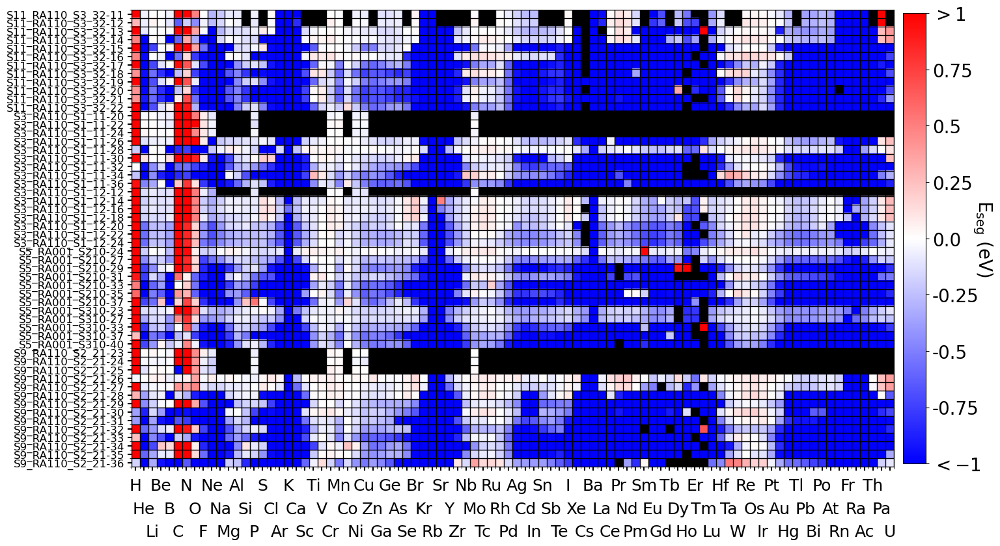

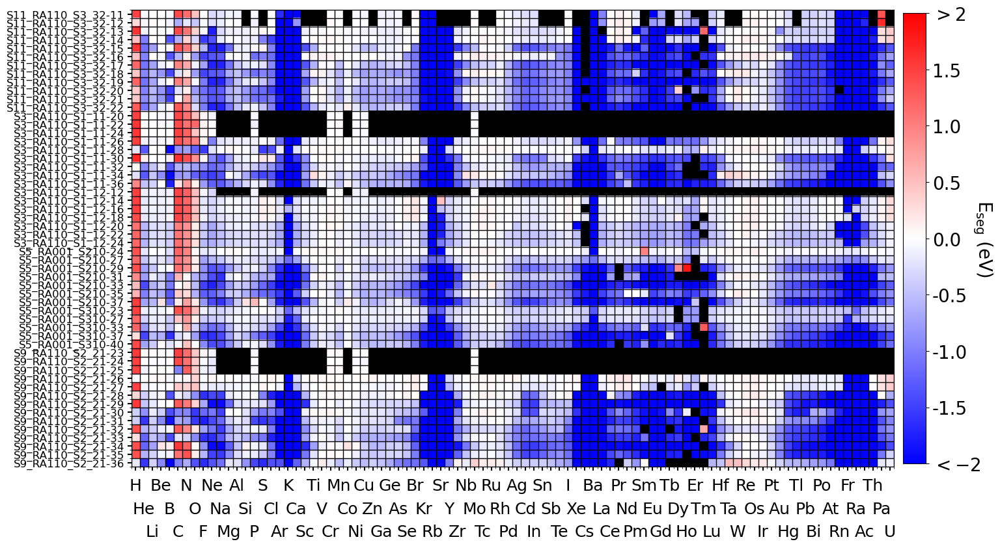

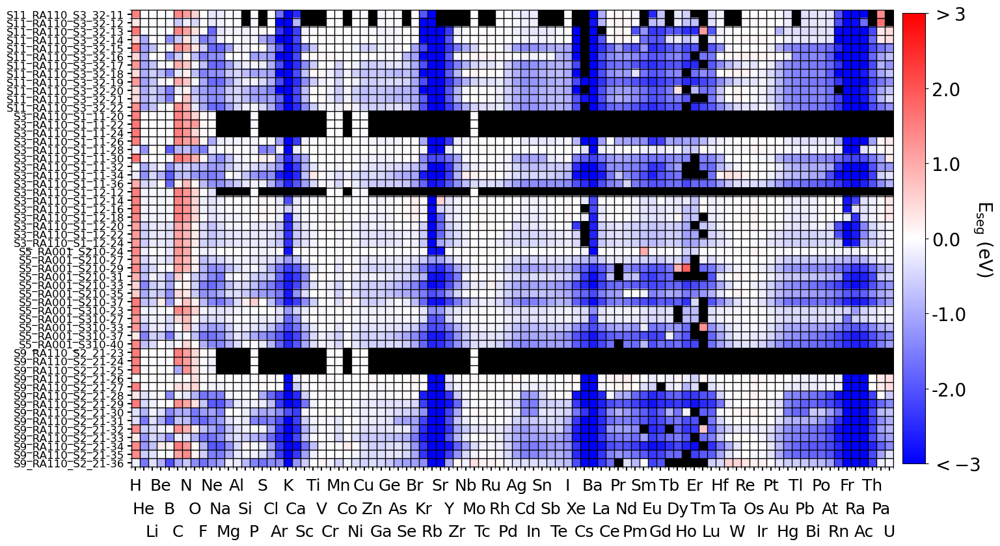

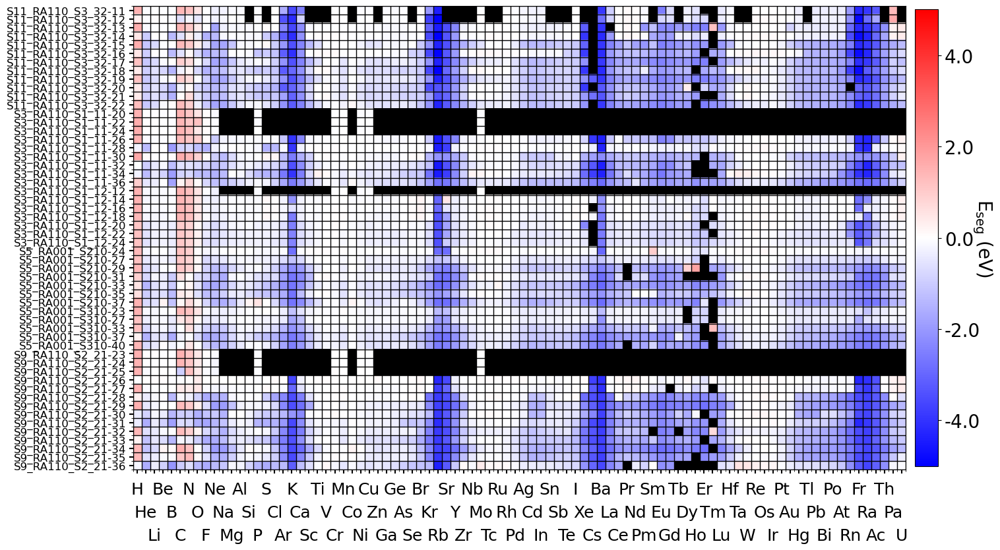

In [3]:
pivot_df = df[(df["convergence"] == True)].pivot_table(values='E_seg', index='GB_site', columns='Z')

for thresholds in [[-1, 1], [-2, 2], [-3, 3], [None, None]]:
    fig, axs = plot_pivot_table(pivot_df,
                    colormap_thresholds=thresholds,
                    figsize=(18, 30),
                    colormap='bwr',
                    colormap_label='E$_{\\rm{seg}}$ (eV)',
                    color_label_fontsize=20,
                    colormap_tick_fontsize=20,
                    xtick_fontsize=18,
                    ytick_fontsize=12,
                    threshold_low=None,
                    threshold_high=None,
                    transpose_axes=False)
    plt.xticks(np.arange(len(pivot_df.columns)), [get_element_symbol(x) for x in pivot_df.columns], rotation=0, fontsize=18)
    #plt.yticks(np.arange(len(pivot_df.index)), [x.split(sep="_")[-1] for x in pivot_df.index] , fontsize=12)

    xtick_yshift = -0.1
    shifts = [-0.01, 0.04, 0.09, 0.14]  # Define y-shift values for three lines
    shifts = [0.09,  0.04, -0.01,]  # Define y-shift values for three lines
    for i, label in enumerate(axs.get_xticklabels()):
        label.set_y(shifts[(i) % 3] + xtick_yshift)
        
    fig.savefig(f"{fig_savepath}/Figures/heatmap_Eseg_vs_GBsite_{thresholds}.png", dpi=300, bbox_inches='tight', pad_inches=0.1)

# Figure S2
## McLean probability of occupation at various Esegs

In [4]:
def calc_C_GB(Temperature,c_bulk,E_seg):
    """
    Calculate the grain boundary concentration.

    :param Temperature: Temperature in Kelvin
    :param c_bulk: Bulk concentration
    :param E_seg: Segregation energy array for a given element at different sites
    :return: Grain boundary concentration
    """
    c_GB = np.divide(c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))\
        ,(1 - c_bulk + c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))))
    return c_GB

/tmp/ipykernel_24055/934789173.py:10: RuntimeWarning: divide by zero encountered in scalar divide
  c_GB = np.divide(c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))\
/tmp/ipykernel_24055/934789173.py:11: RuntimeWarning: divide by zero encountered in scalar divide
  ,(1 - c_bulk + c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))))
/tmp/ipykernel_24055/934789173.py:10: RuntimeWarning: invalid value encountered in divide
  c_GB = np.divide(c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))\
/tmp/ipykernel_24055/934789173.py:10: RuntimeWarning: overflow encountered in exp
  c_GB = np.divide(c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))\
/tmp/ipykernel_24055/934789173.py:11: RuntimeWarning: overflow encountered in exp
  ,(1 - c_bulk + c_bulk * np.exp(-E_seg/(8.6173303e-05*Temperature))))


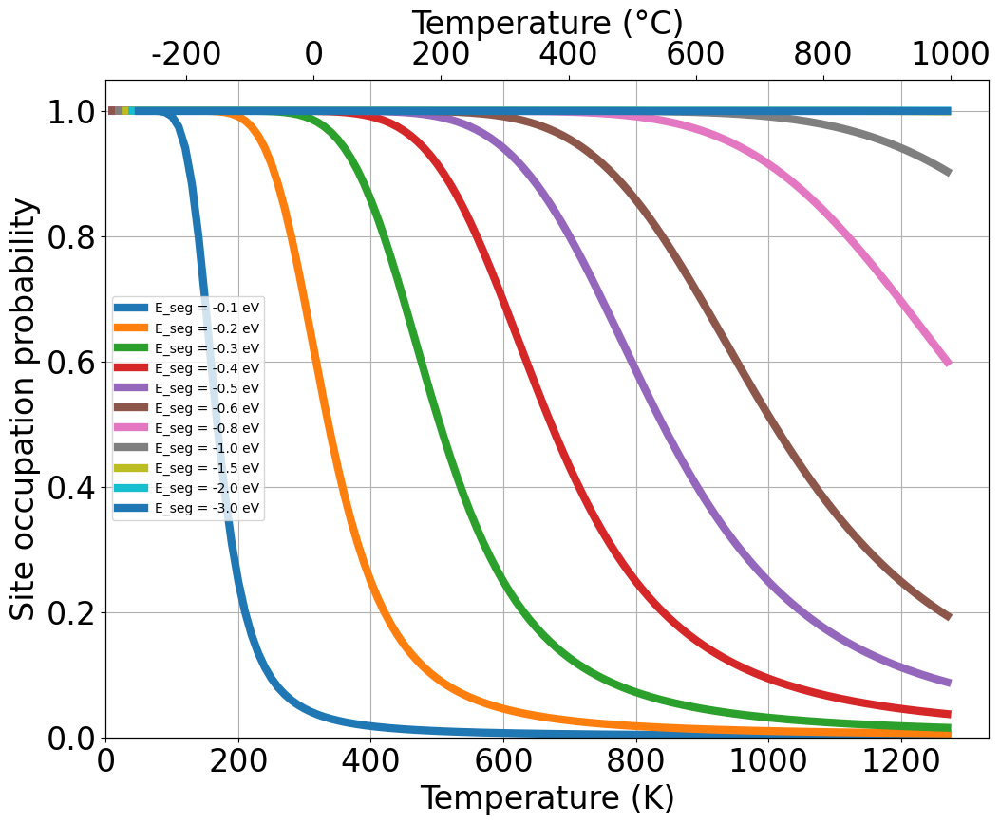

In [5]:
# Define the E_seg values
E_seg_values = -np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 1.0, 1.5, 2, 3])

# Define the temperature range (for example, 300K to 1000K in steps of 50K)
temperatures = np.arange(0, 1273.15, 10)


# Assuming atomic_pct_conc is 0.1 (10%)
atomic_pct_conc = 0.1
fig, ax1 = plt.subplots(figsize=(12, 9))

# Placeholder for calculated site concentrations
site_concs = {E_seg: [] for E_seg in E_seg_values}

# Calculate site concentrations for each E_seg and temperature
for E_seg in E_seg_values:
    for temp in temperatures:
        site_conc = calc_C_GB(temp, atomic_pct_conc*0.01, E_seg)
        site_concs[E_seg].append(site_conc)

for E_seg, concs in site_concs.items():
    ax1.plot(temperatures, concs, label=f'E_seg = {E_seg} eV', linewidth = 6)

ax1.set_xlabel('Temperature (K)', fontsize=24)
ax1.set_ylabel('Site occupation probability', fontsize=24)
ax1.tick_params(axis='x', labelsize=24)
ax1.tick_params(axis='y', labelsize=24)
# plt.title('Segregation Profiles as a Function of Temperature')
# plt.legend()
plt.grid(True)
# Define specific Celsius temperatures for x-ticks
celsius_ticks = [-200, 0, 200, 400, 600, 800, 1000]
# Convert Celsius ticks to Kelvin for placement
kelvin_ticks = [c + 273.15 for c in celsius_ticks]

# Secondary x-axis for degrees Celsius
ax2 = ax1.twiny()
ax2.set_xlim(ax1.get_xlim())
# Set the secondary axis ticks to correspond to the converted Kelvin values
ax2.set_xticks(kelvin_ticks)
# Label the secondary axis with the original Celsius values
ax2.set_xticklabels([f"{c}" for c in celsius_ticks])
ax2.set_xlabel("Temperature (°C)", fontsize=24)
ax2.tick_params(axis='x', labelsize=24)

ax1.legend()
# Setting axes limits to have a floor at 0
ax1.set_xlim(left=0)
ax1.set_ylim(bottom=0)
fig.savefig(f'/mnt/c/Users/liger/Koofr/Fe-PtableTrends-Manuscript/Figures/McLean_SiteOccupation_vs_Eseg.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

# Figure S4 - S10
## Expected interfacial coverage over various temps, atom %

In [6]:
df_spectra_lst = []

for gb, gb_df in df[df["dist_GB"] < 3.5].groupby("GB"):
    for element, element_df in gb_df.groupby("element"):
        element_df = element_df.dropna(subset=["structure"])
        element_df = element_df.reset_index(drop=True)
        unique_site_spectra = element_df.E_seg.values
        element_seg_spectra = []
        element_coh_min_ANSBO_spectra =[]
        element_coh_min_wsep_spectra = []
        element_df["eta_min_R_ANSBO"] = element_df.R_DDEC6_ANSBO.values - 1
        element_df["eta_min_R_Wsep_RGS"] = element_df.R_Wsep_RGS.values - 1
        for _, site_row in element_df.iterrows():
            element_seg_spectra += [site_row.E_seg] * int(site_row.site_multiplicity)
            element_coh_min_ANSBO_spectra += [site_row.eta_min_R_ANSBO] * int(site_row.site_multiplicity)
            element_coh_min_wsep_spectra += [site_row.eta_min_R_Wsep_RGS] * int(site_row.site_multiplicity)
        df_spectra_lst.append([gb,
                           element,
                           element_df.Z.values[0],
                           element_df.site.values,
                           element_df.site_multiplicity.values,
                           element_seg_spectra,
                           unique_site_spectra,
                           element_coh_min_ANSBO_spectra,
                           element_df.eta_min_R_ANSBO.values,
                           element_coh_min_wsep_spectra,
                            element_df.eta_min_R_Wsep_RGS.values])
df_spectra = pd.DataFrame(df_spectra_lst, columns = ["GB",
                                    "element",
                                    "Z",
                                    "unique_sites",
                                    "site_multiplicity",
                                    "full_seg_spectra",
                                    "unique_seg_spectra",
                                    "eta_coh_ANSBO_spectra",
                                    "unique_eta_ANSBO_spectra",
                                    "eta_coh_wsep_spectra",
                                    "unique_eta_wsep_spectra"])

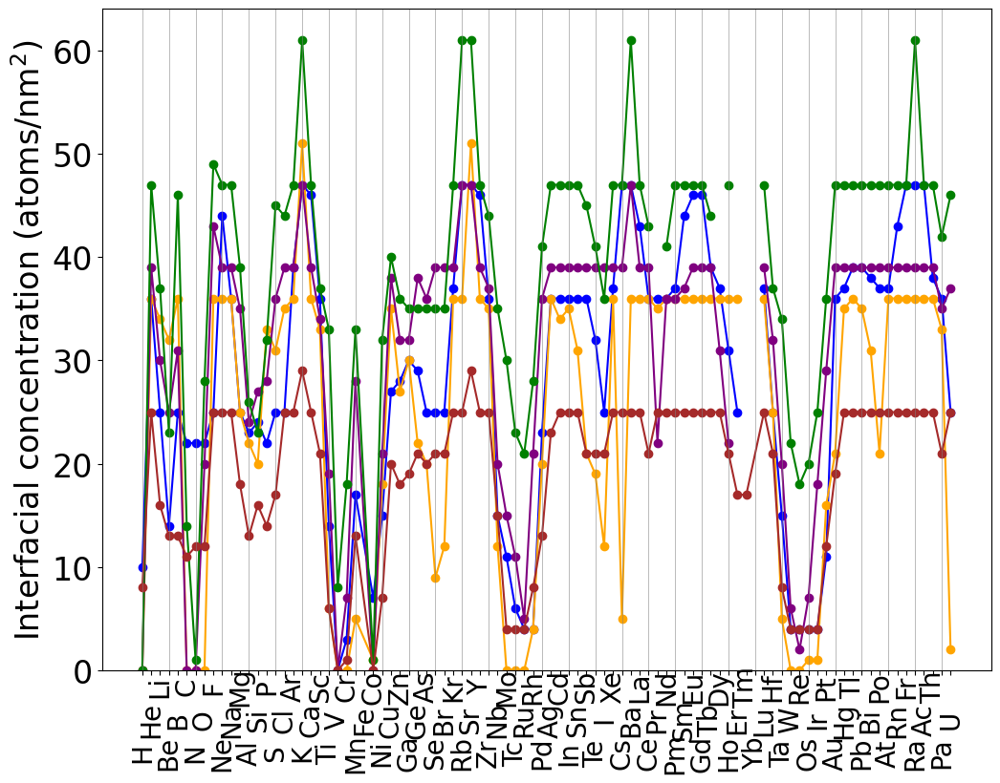

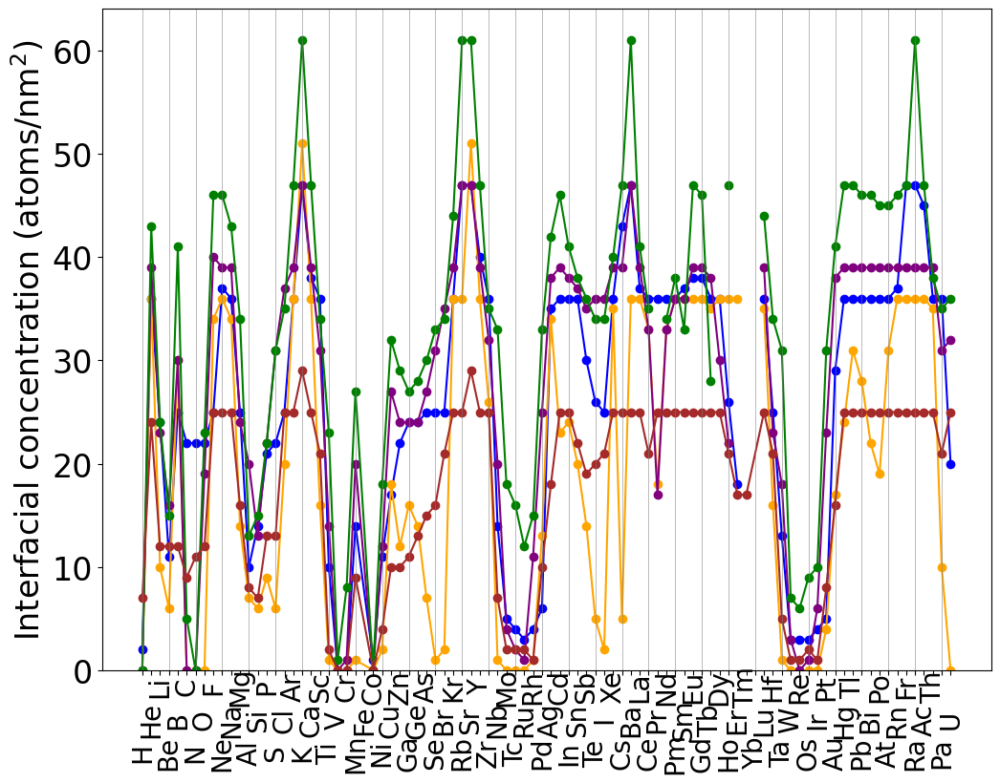

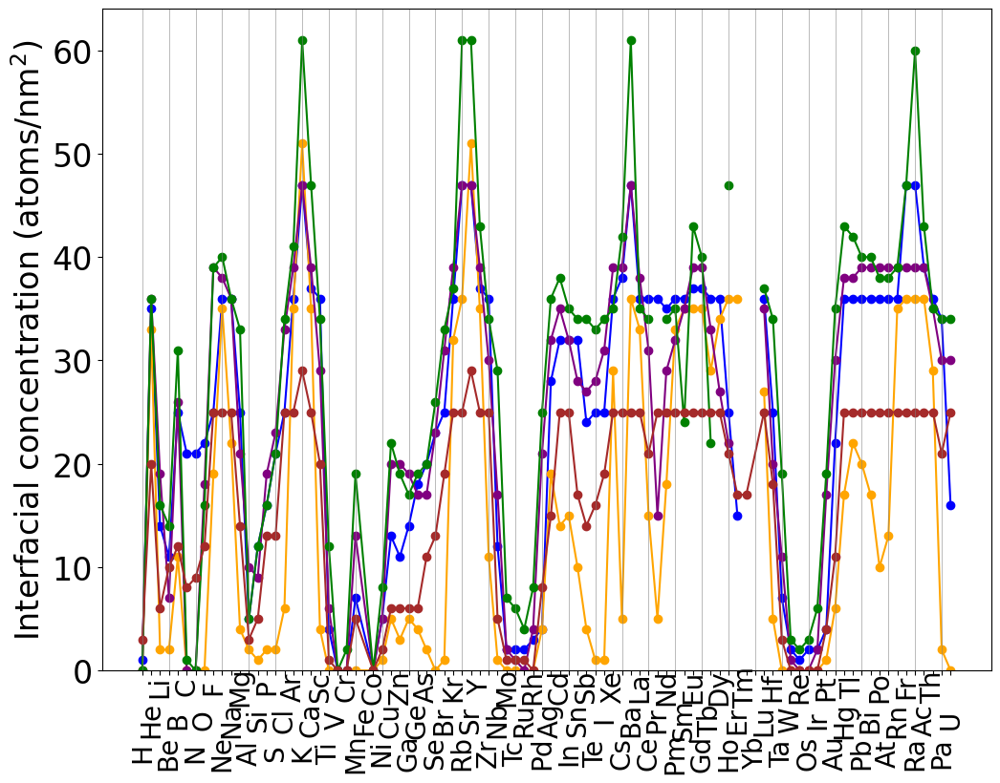

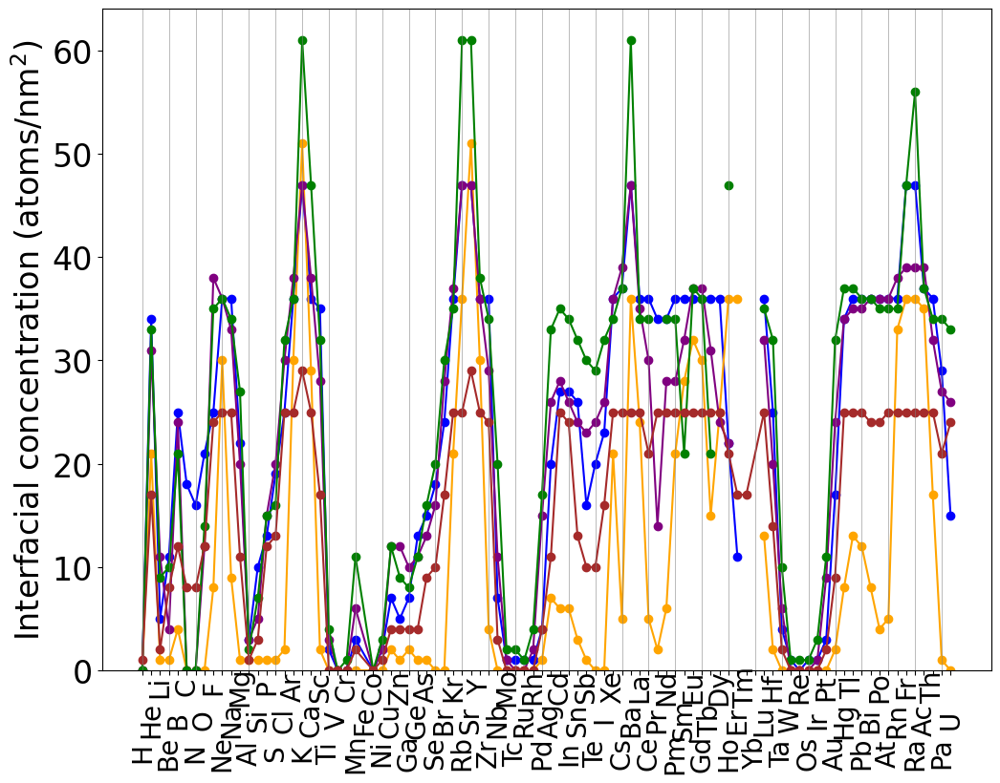

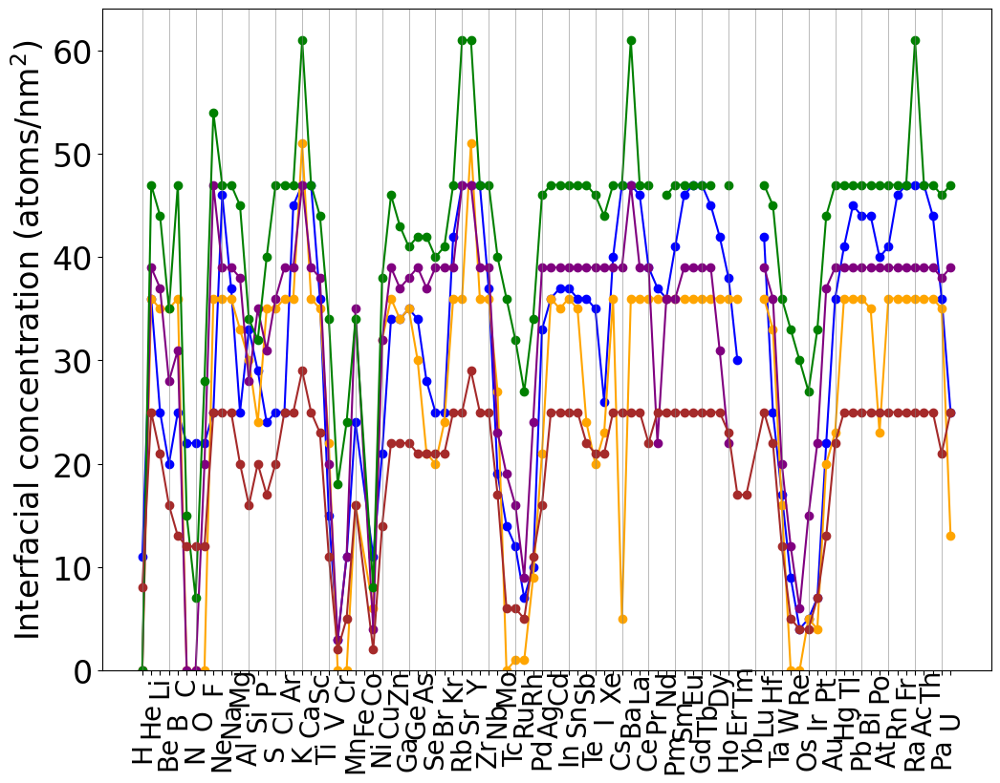

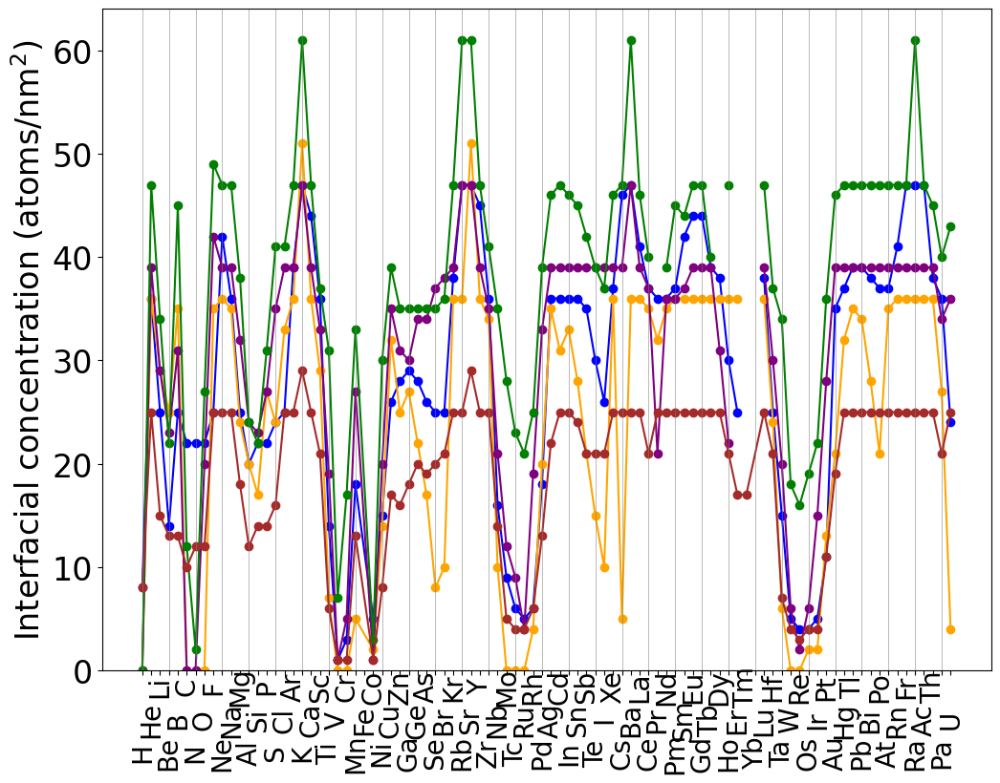

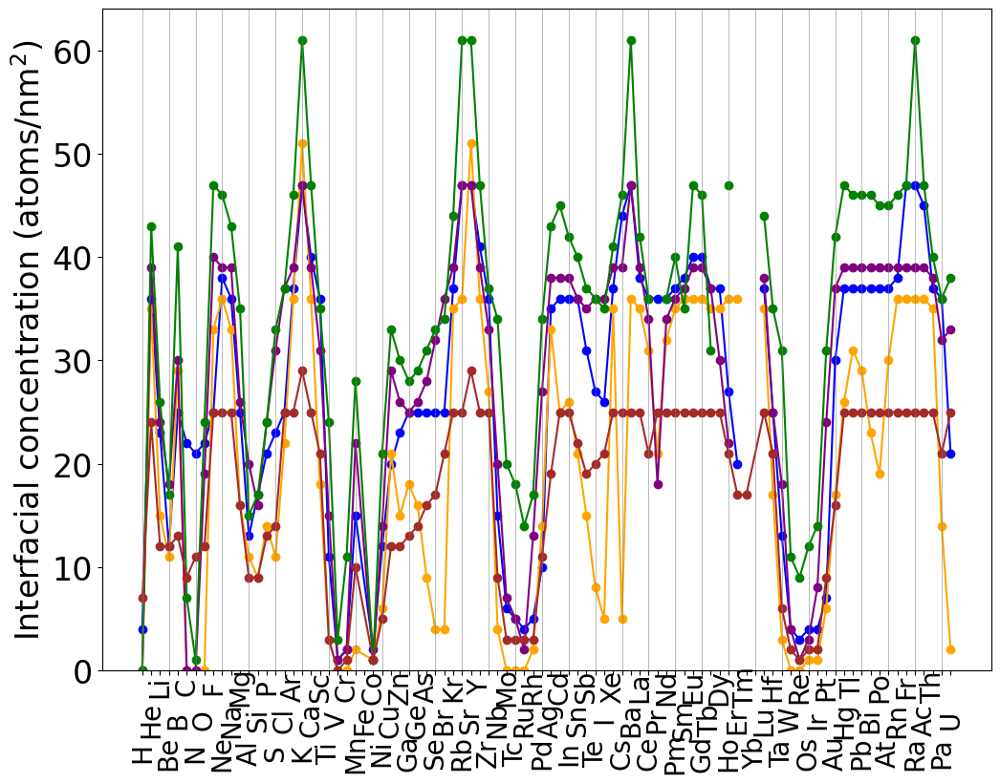

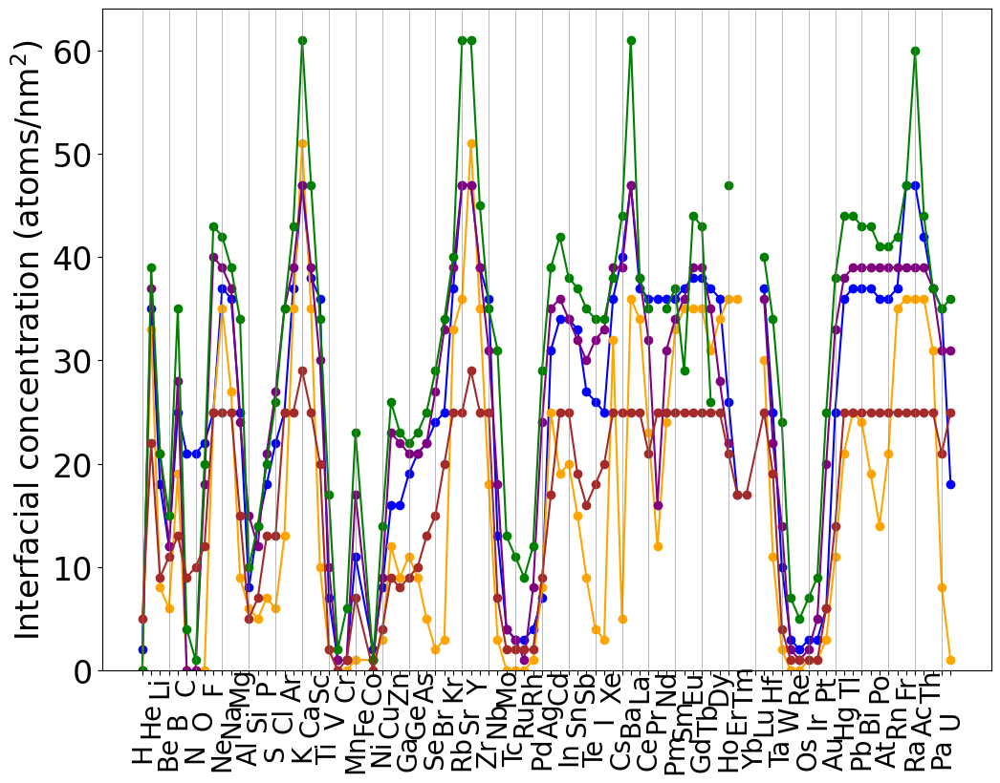

In [7]:
def get_GB_area(df_seg, GB):
    df_GB = df_seg[df_seg["GB"] == GB]
    struct =  Structure.from_str(df_GB.structure.iloc[0], fmt="json")
    area  = struct.volume/struct.lattice.c*0.01
    return area

xtick_yshift = -0.10
xtick_fontsize = ytick_fontsize = 24
xtick_labels = bulk_df.element.tolist()
xtick_posns = bulk_df.Z.values

elements_to_skip = ["Rb", "Cs", "Fr", "Ca", "Sr", "Ba", "Ra", "Ac", "Th", "Pa", "U", "Ne", "Ar", "Kr", "Xe", "Rn", "K", "H", "B", "C", "N", "O"]
atomic_pct_concs = [0.1, 1]  # Concentration values in percentage
temps = [300, 500, 700, 900]  # Temperature values

for atomic_pct_conc in atomic_pct_concs:
    for temp in temps:
        interf_conc_temp = []
        for _, row in df_spectra.iterrows():
            interfacial_conc = calc_C_GB(temp, atomic_pct_conc * 0.01, np.array(row.full_seg_spectra)).sum() / get_GB_area(df, row.GB)
            interf_conc_temp.append(interfacial_conc)
        df_spectra[f"conc_{temp}_{atomic_pct_conc}"] = np.round(interf_conc_temp)

        fig, ax1 = plt.subplots(figsize=(12, 9))
        xtick_labels = bulk_df.element.tolist()
        xtick_posns = bulk_df.Z.values

        for GB, GB_df in df_spectra.groupby(by="GB"):
            if GB in ["S11_RA110_S3_32"]:
                continue
            GB_df = GB_df.sort_values(by="Z")
            plt.plot(GB_df['Z'], GB_df[f"conc_{temp}_{atomic_pct_conc}"], marker='o', linestyle='-', label=gb_latex_dict[GB], color=custom_colors[GB])

        ax1.set_xticks(xtick_posns)
        ax1.set_xticklabels(xtick_labels, fontsize=20, rotation=90, va='center')
        ax1.tick_params(axis='y', labelsize=24)
        
        # Applying the y-shift to tick labels as originally specified
        shifts = [-0.01, 0.04, 0.09]  # Define y-shift values for tick labels
        for i, label in enumerate(ax1.get_xticklabels()):
            label.set_y(shifts[i % len(shifts)] + xtick_yshift)

        ax1.grid(False)  # Ensure grid is off
        gridline_positions = np.arange(1, 93, 3)
        for pos in gridline_positions:
            ax1.axvline(x=pos, linestyle='-', linewidth='0.5', color='grey', alpha=0.75)

        plt.ylabel(r'Interfacial concentration (atoms/nm$^2$)', fontsize=24)
        plt.ylim((0, None))
        fig.savefig(f'/mnt/c/Users/liger/Koofr/Fe-PtableTrends-Manuscript/Figures/Props_vs_Z/InterfConc_{temp}K_{atomic_pct_conc}.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

# Figure S11 - S12
## Cohesion vs Z
### Rigid Wsep

In [8]:
df_filt = df[
    (df["E_seg"] < -0.05) &
    (df["convergence"] == True) &
    (df["R_Wsep_RGS"] > -1) &
    (
        (~df["element"].isin(["Tm", "Lu"])) | 
        ((df["element"].isin(["Tm", "Lu"])) & (df["R_Wsep_RGS"] > 0.4) & (df["R_Wsep_RGS"] < 1.5))
    )
].dropna(subset=["E_seg"])

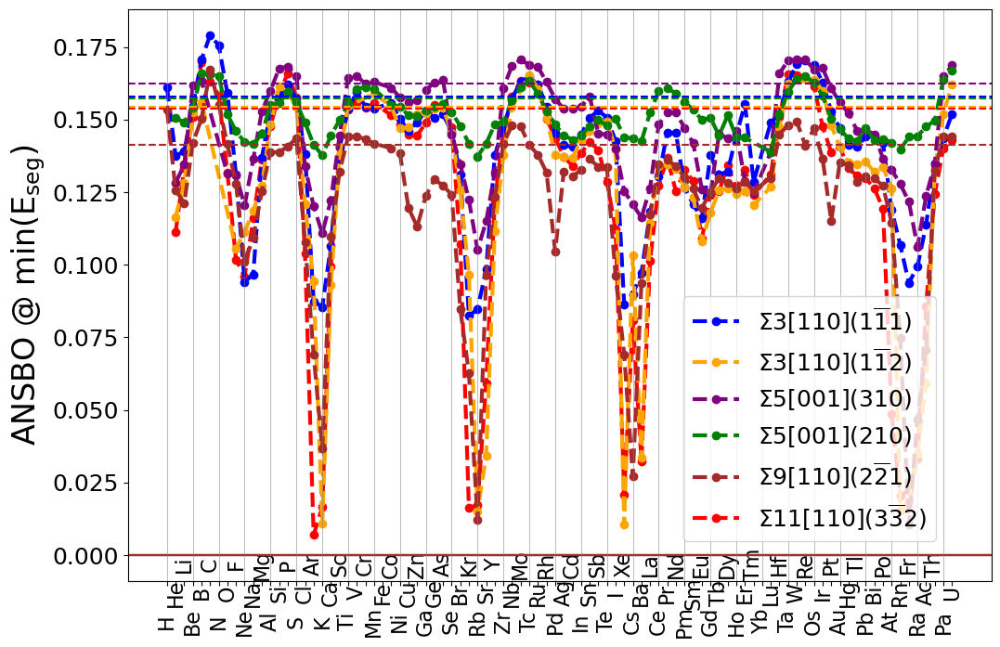

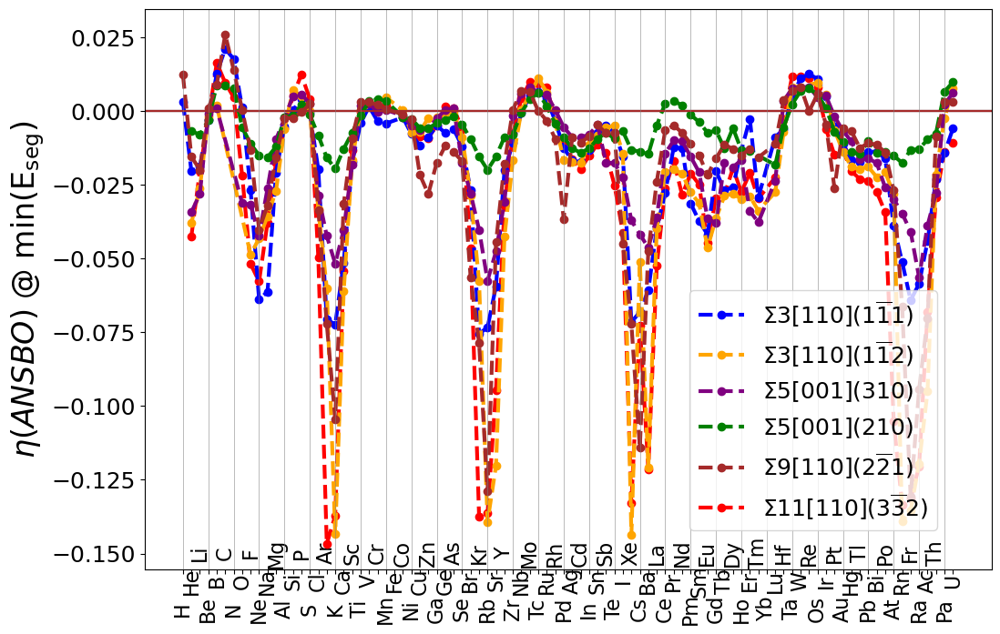

In [9]:
fig, ax1 = plot_minEseg_prop_vs_Z(df_filt,
                        y_prop="DDEC6_min_ANSBO",
                      x_prop="Z",
                      ylabel=r"ANSBO @ $\rm{min}(E_{\rm{seg}})$",
                      figsize=(12, 8),
                      shift_xticks=True,
                      xlabel_fontsize=24,
                      xtick_yshift = -0.045,
                      ylabel_fontsize=24,
                      xtick_fontsize=16,
                      ytick_fontsize=18,
                      legend_fontsize=18)
for GB, GB_df in df_filt.groupby("GB"):
  ax1.axhline(GB_df.iloc[0].pure_DDEC6_min_ANSBO, linestyle="--", color=custom_colors[GB])
fig.savefig(f'{fig_savepath}/ANSBO_vs_Z.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

df_filt["eta_min_ANSBO"] = df_filt["DDEC6_min_ANSBO"] - df_filt["pure_DDEC6_min_ANSBO"]
fig, ax1 = plot_minEseg_prop_vs_Z(df_filt[df_filt["E_seg"] < 0],
                        y_prop="eta_min_ANSBO",
                      x_prop="Z",
                      ylabel=r"$\eta(ANSBO)$ @ $\rm{min}(E_{\rm{seg}})$",
                      figsize=(12, 8),
                      shift_xticks=True,
                      xlabel_fontsize=24,
                      xtick_yshift = -0.045,
                      ylabel_fontsize=24,
                      xtick_fontsize=16,
                      ytick_fontsize=18,
                      legend_fontsize=18)

fig.savefig(f'{fig_savepath}/etaANSBO_vs_Z.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

### ANSBO

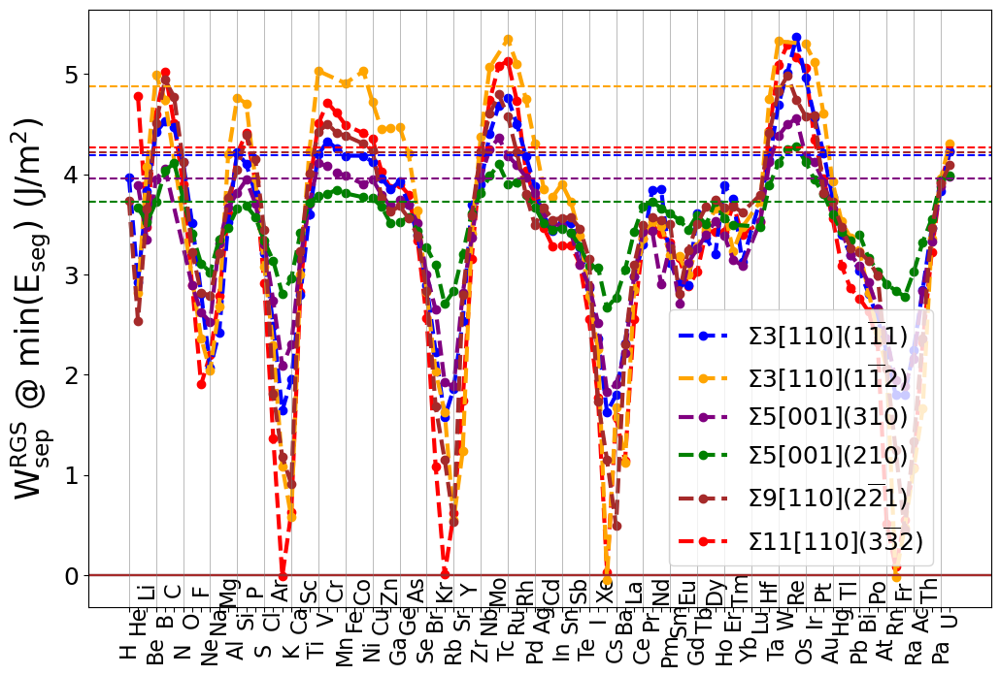

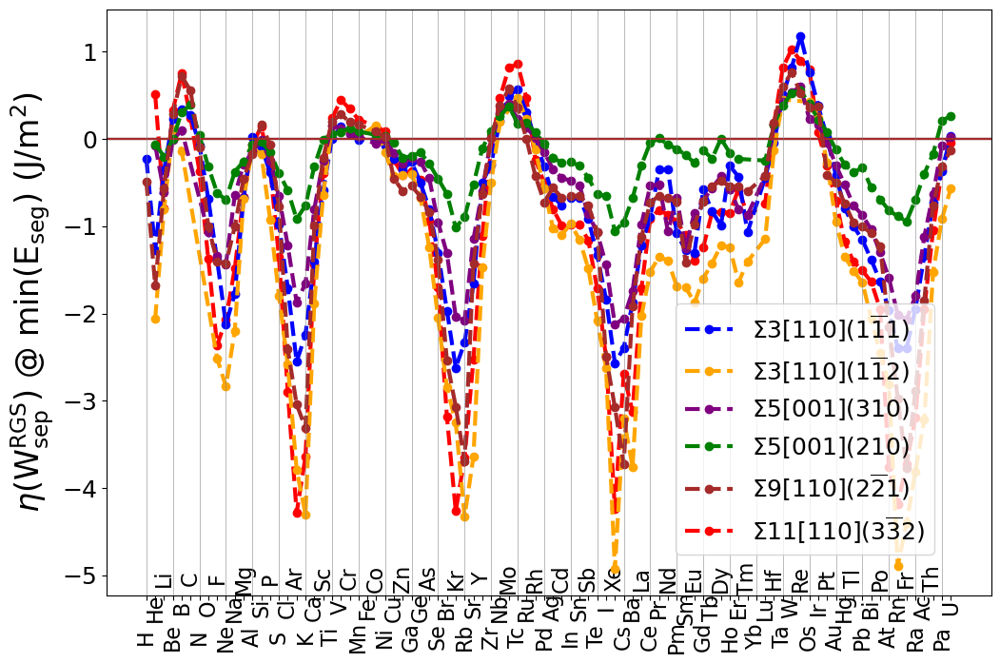

In [10]:
fig, ax1 = plot_minEseg_prop_vs_Z(df_filt[df_filt["E_seg"] < 0],
                              y_prop="Wsep_RGS_min",
                              x_prop="Z",
                              ylabel=r"W$_{\rm{sep}}^{\rm{RGS}}$ @ $\rm{min}(E_{\rm{seg}})$ (J/m$^2$)",
                              figsize=(12, 8),
                              shift_xticks=True,
                              xlabel_fontsize=24,
                              xtick_yshift = -0.045,
                              ylabel_fontsize=24,
                              xtick_fontsize=16,
                              ytick_fontsize=18,
                              legend_fontsize=18)

for GB, GB_df in df_filt.groupby("GB"):
  ax1.axhline(GB_df.iloc[0].pure_min_wsep_rigid, linestyle="--", color=custom_colors[GB])

fig.savefig(f'{fig_savepath}/Figures/Wsep_vs_Z.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
df_filt["eta_min_Wsep_RGS"] = df_filt["Wsep_RGS_min"] - df_filt["Wsep_RGS_min_pure"]
fig, ax1 = plot_minEseg_prop_vs_Z(df_filt[df_filt["E_seg"] < 0],
                        y_prop="eta_min_Wsep_RGS",
                      x_prop="Z",
                      ylabel=r"$\eta$(W$_{\rm{sep}}^{\rm{RGS}}$) @ $\rm{min}(E_{\rm{seg}})$ (J/m$^2$)",
                      figsize=(12, 8),
                      shift_xticks=True,
                      xlabel_fontsize=24,
                      xtick_yshift = -0.045,
                      ylabel_fontsize=24,
                      xtick_fontsize=16,
                      ytick_fontsize=18,
                      legend_fontsize=18)

fig.savefig(f'{fig_savepath}/Figures/etaWsep_vs_Z.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

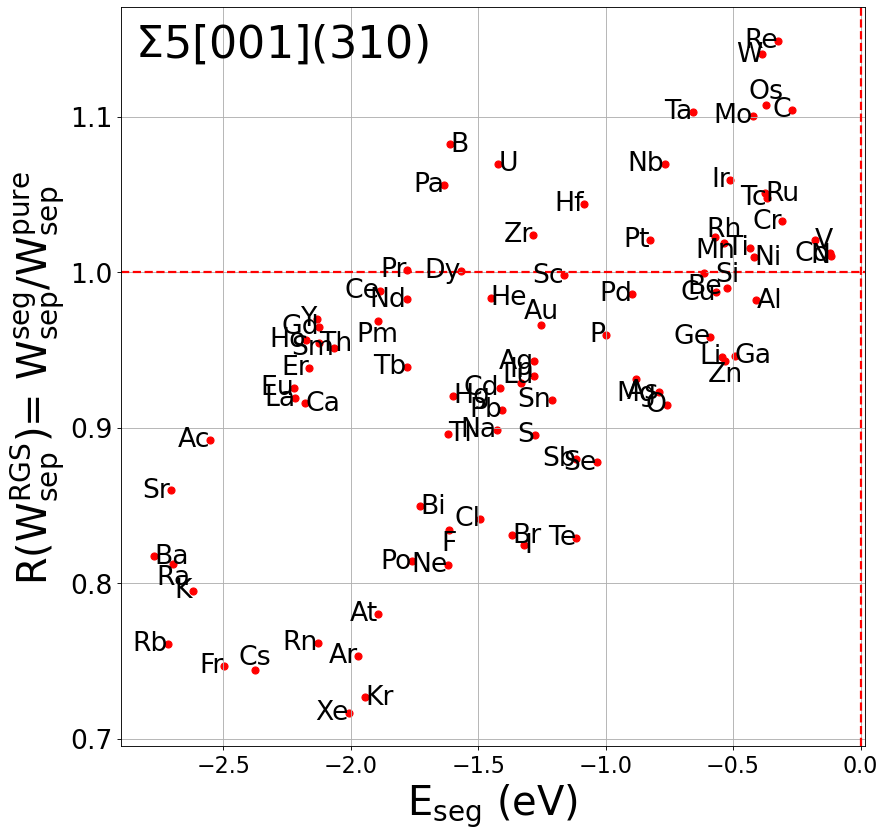

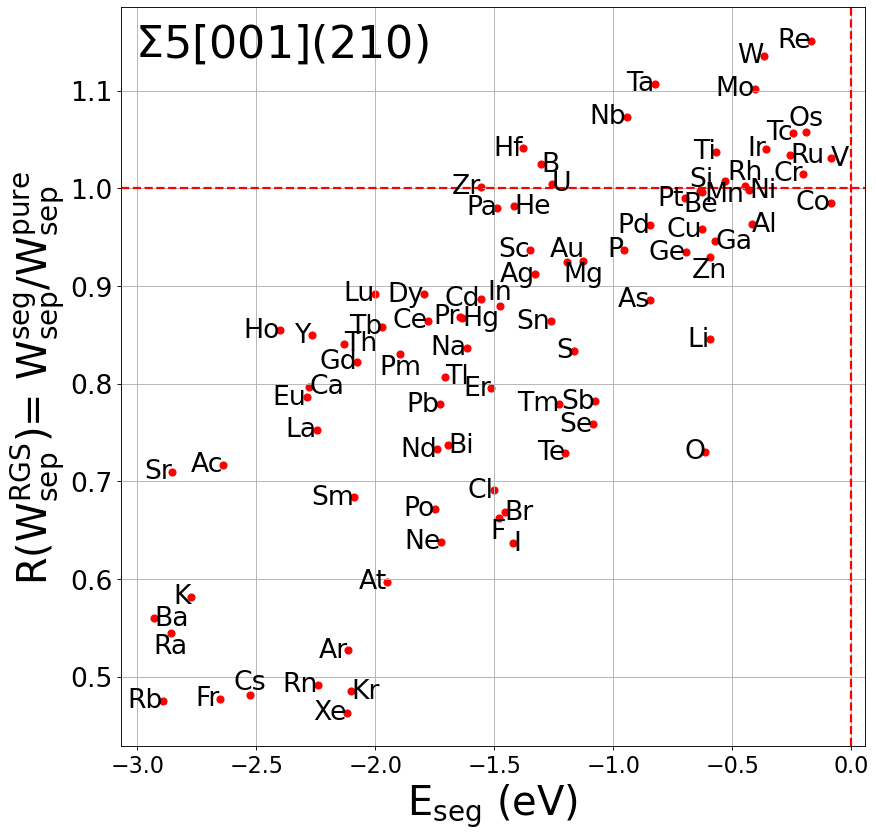

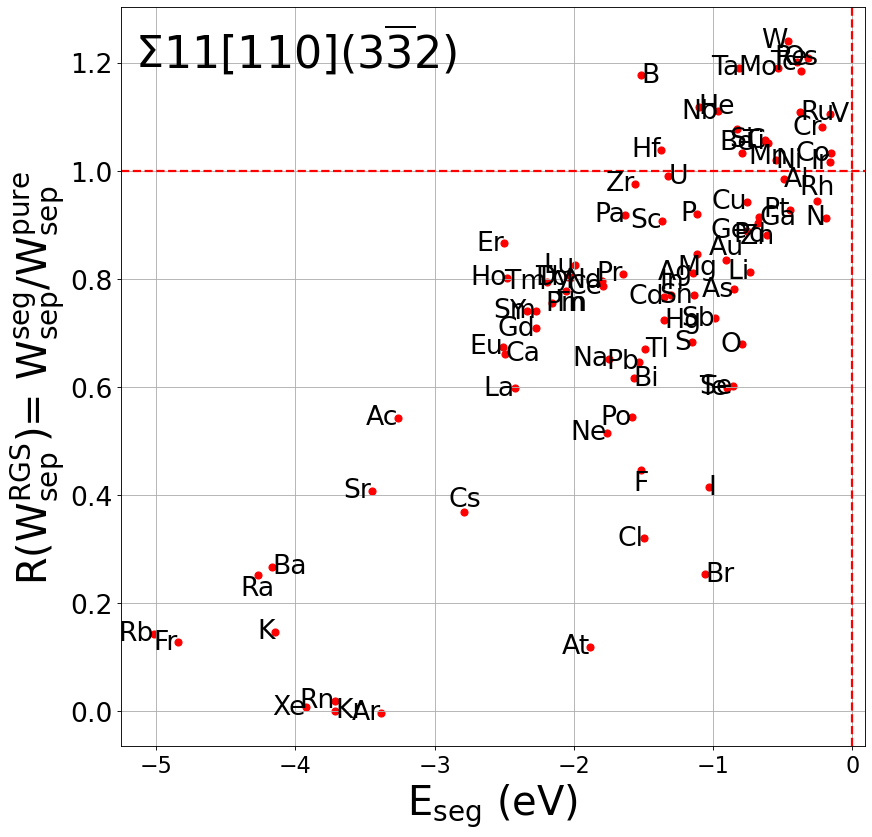

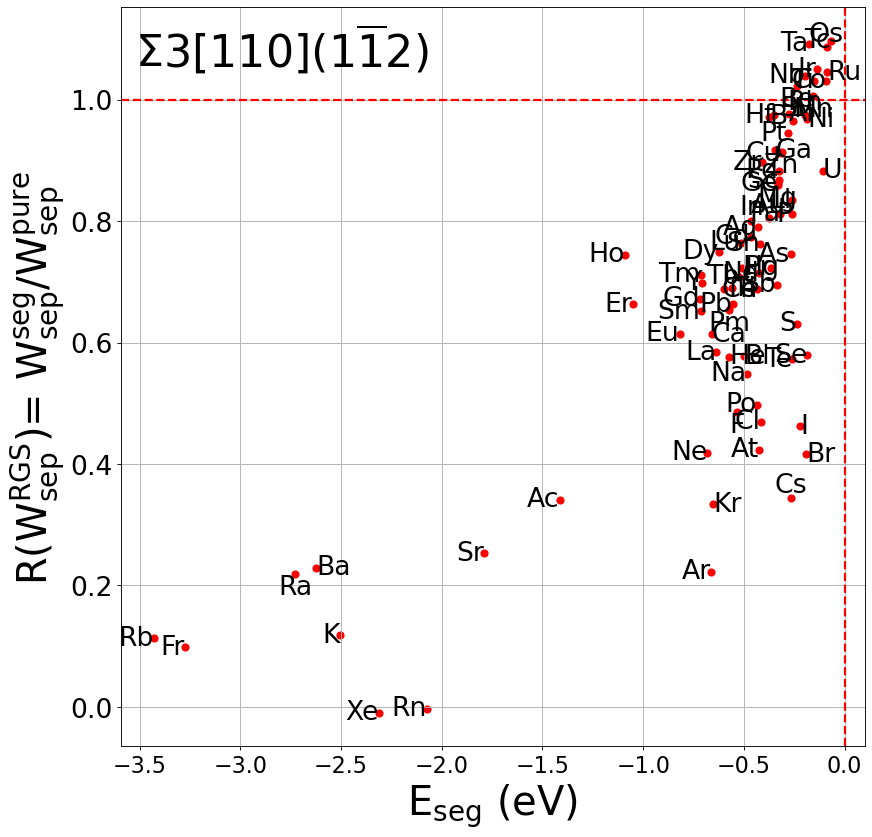

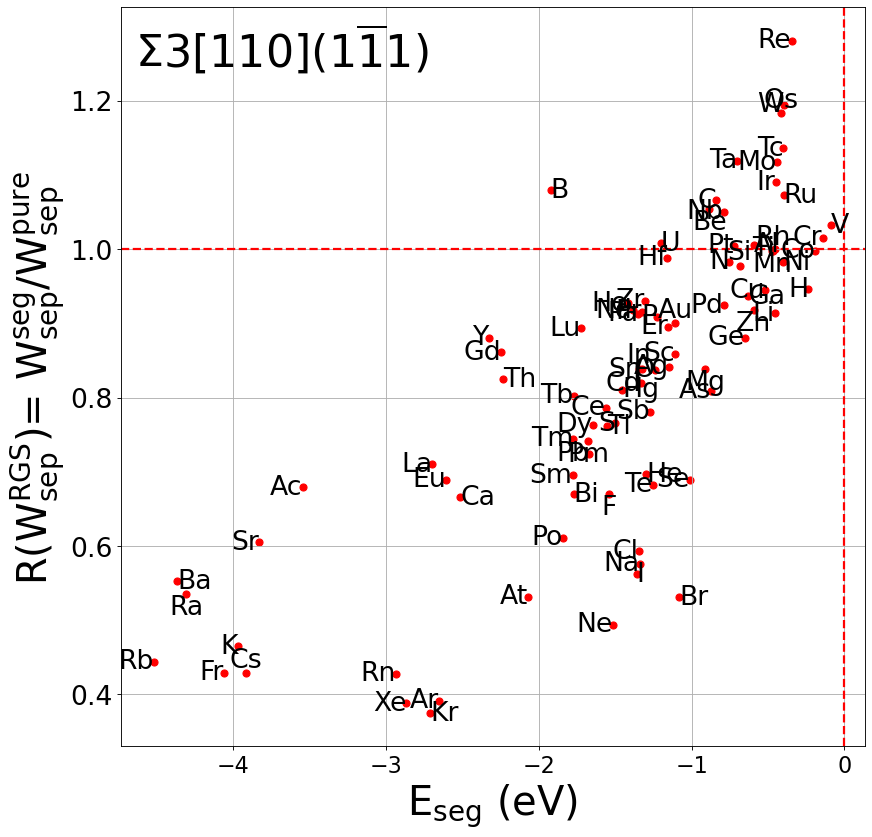

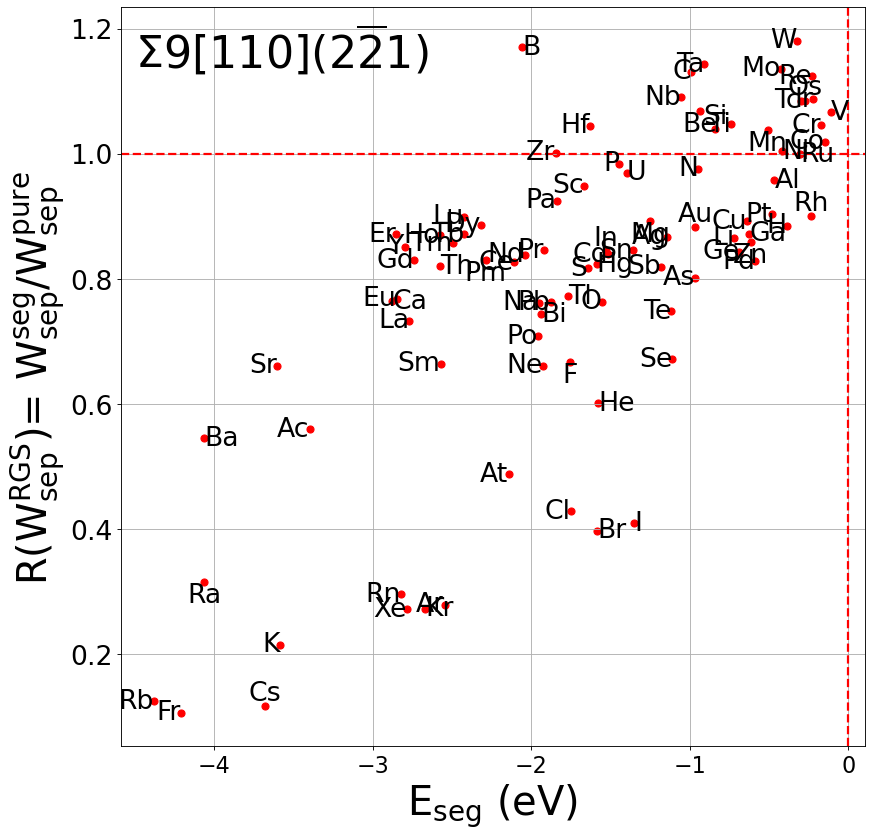

In [11]:
x_prop = "E_seg"
y_prop = "R_Wsep_RGS"

for GB in ['S5_RA001_S310', 'S5_RA001_S210', 'S11_RA110_S3_32', 'S3_RA110_S1_12', 'S3_RA110_S1_11', 'S9_RA110_S2_21']:
    # Try any particular GB! Find the appropriate strings from gb_latex_dict.keys()
    # ['S5_RA001_S310', 'S5_RA001_S210', 'S11_RA110_S3_32', 'S3_RA110_S1_12', 'S3_RA110_S1_11', 'S9_RA110_S2_21']
    # Exclude Tm because of weirdness of result... surface calc likely is wrong
    fig, ax = plot_prop_vs_prop_GB(df_filt,
                                gb_to_plot=GB,
                                y_prop=y_prop,
                                x_prop=x_prop,
                                ylabel=r"R(W$_{\rm{sep}}^{\rm{RGS}}$)= W$_{\rm{sep}}^{\rm{seg}}$/W$_{\rm{sep}}^{\rm{pure}}$", 
                                xlabel=r"E$_{\rm{seg}}$ (eV)",
                                custom_colors=custom_colors,
                                gb_latex_dict=gb_latex_dict,
                                label_left=[],
                                label_right=["Ga", "Al", "U", "B", "He", "Ni", "V", "Ru", "Bi", "Ca", "Kr", "I", "Hg", "Tl", "Th", "Ba", "Br"],
                                label_bottom=["Mn", "Be", "Mg", "Ra", "F", "Pm", "Zn"],
                                label_top=["Os", "Rh", "Si", "Au", "Cs", "In"],
                                horizontal_padding=0.0002,
                                vertical_padding=0.0001)
    write_path = f"{fig_savepath}/Figures/SegregationEngineering_min_{x_prop}_vs_R_wsep_{GB}.png"
    fig.savefig(write_path, dpi=300, bbox_inches='tight', pad_inches=0.1)

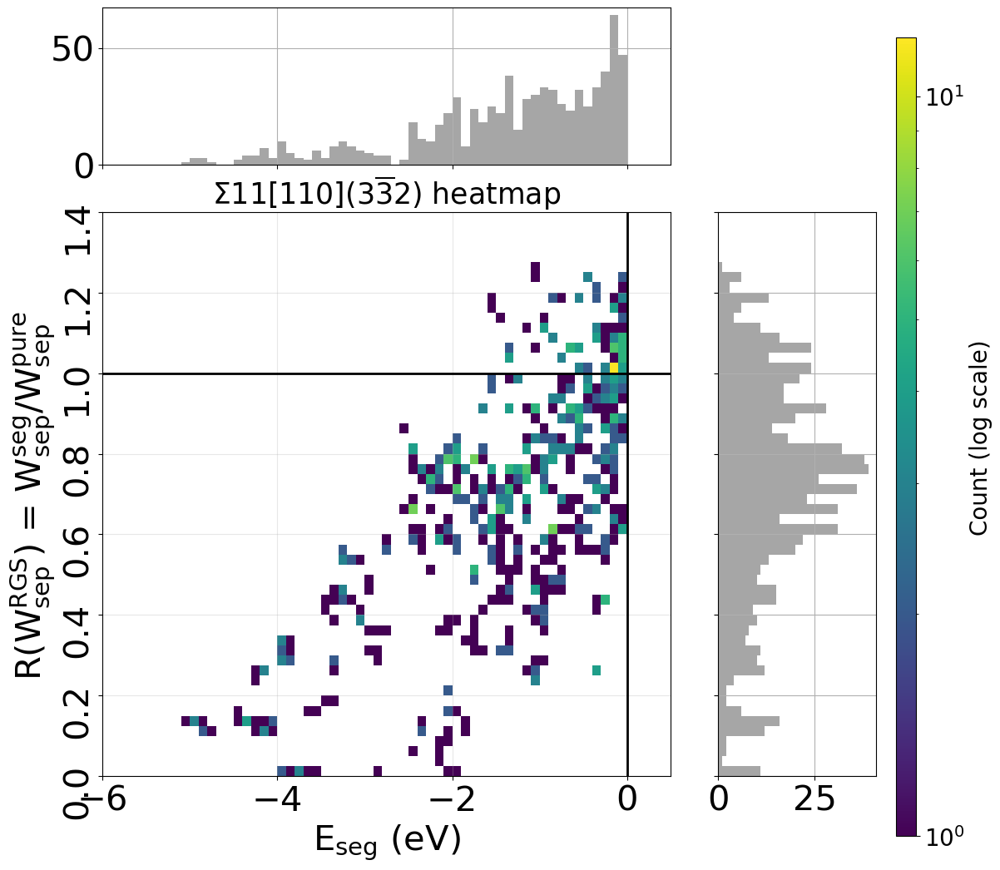

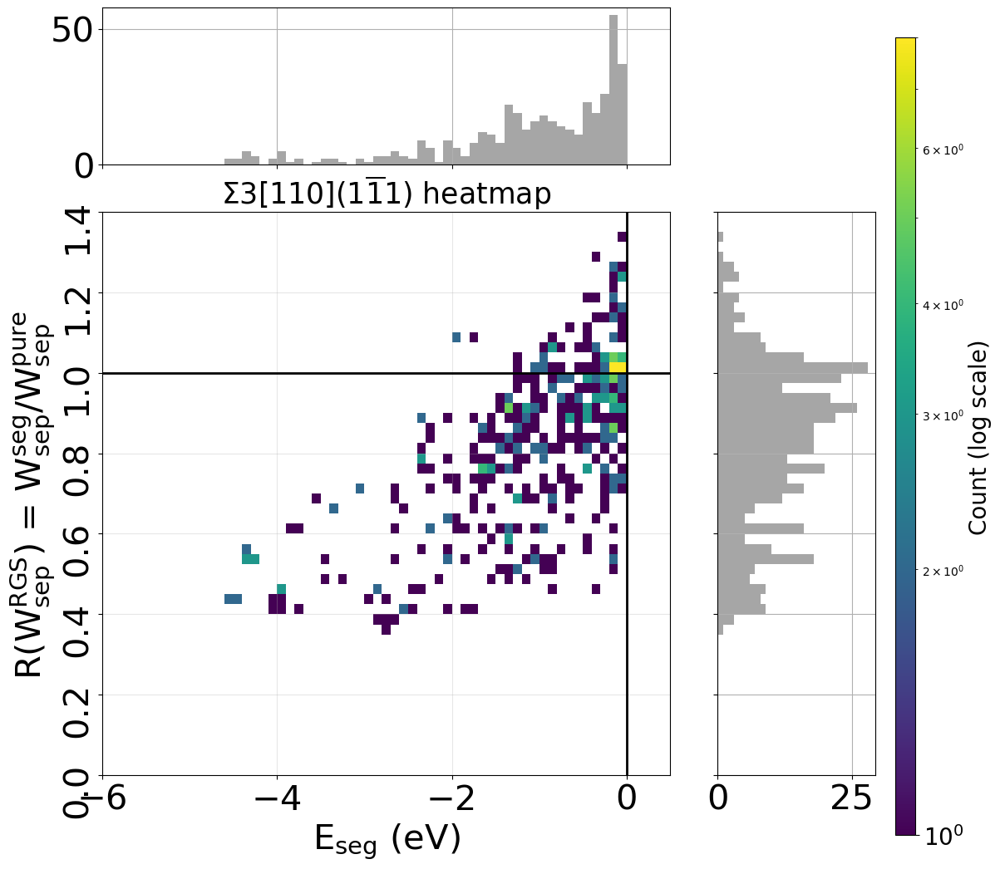

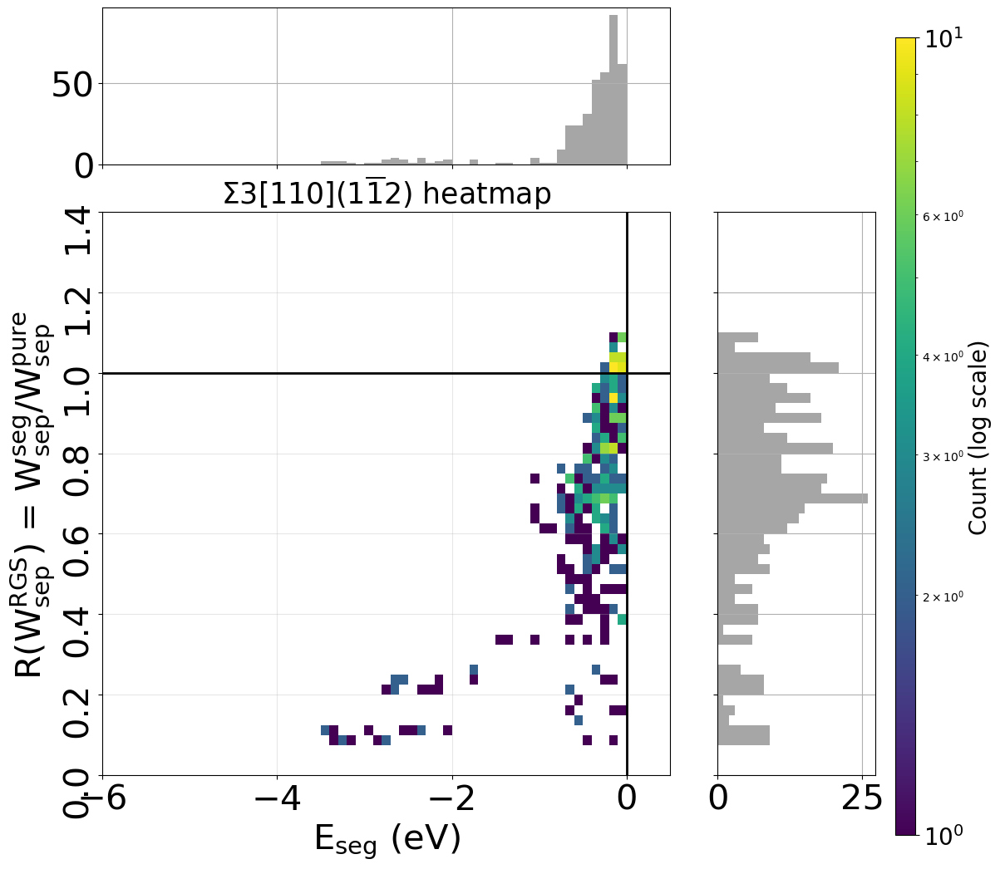

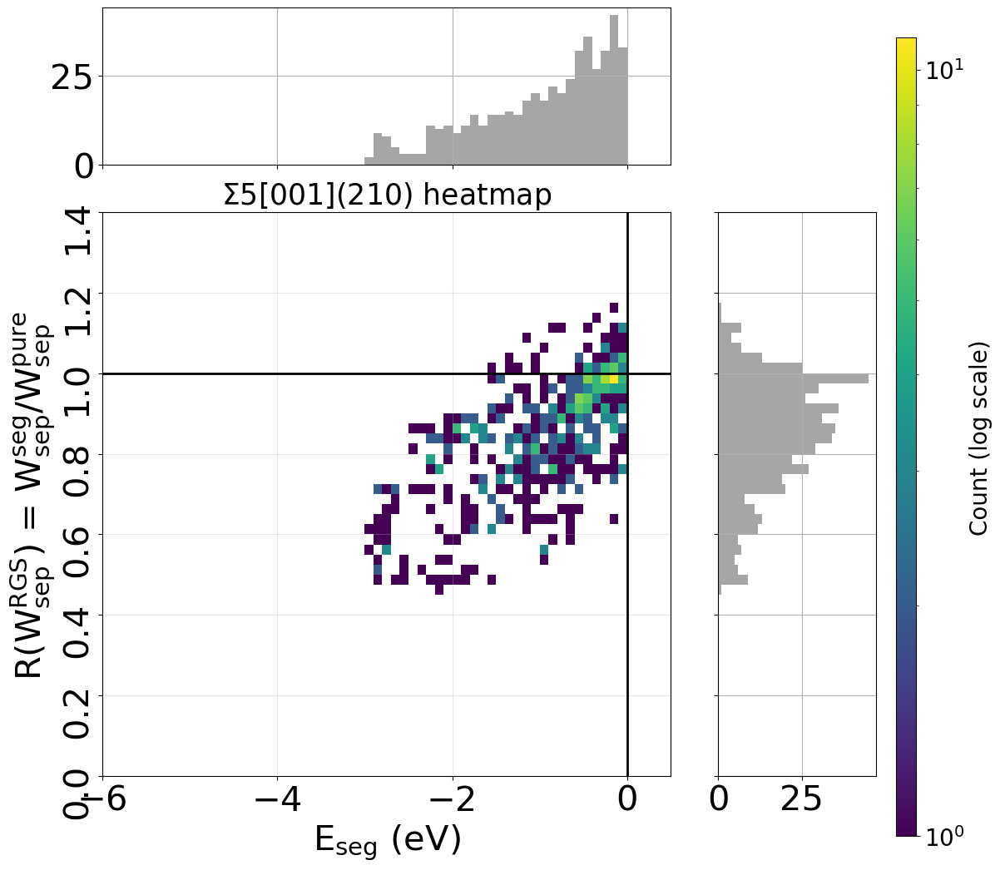

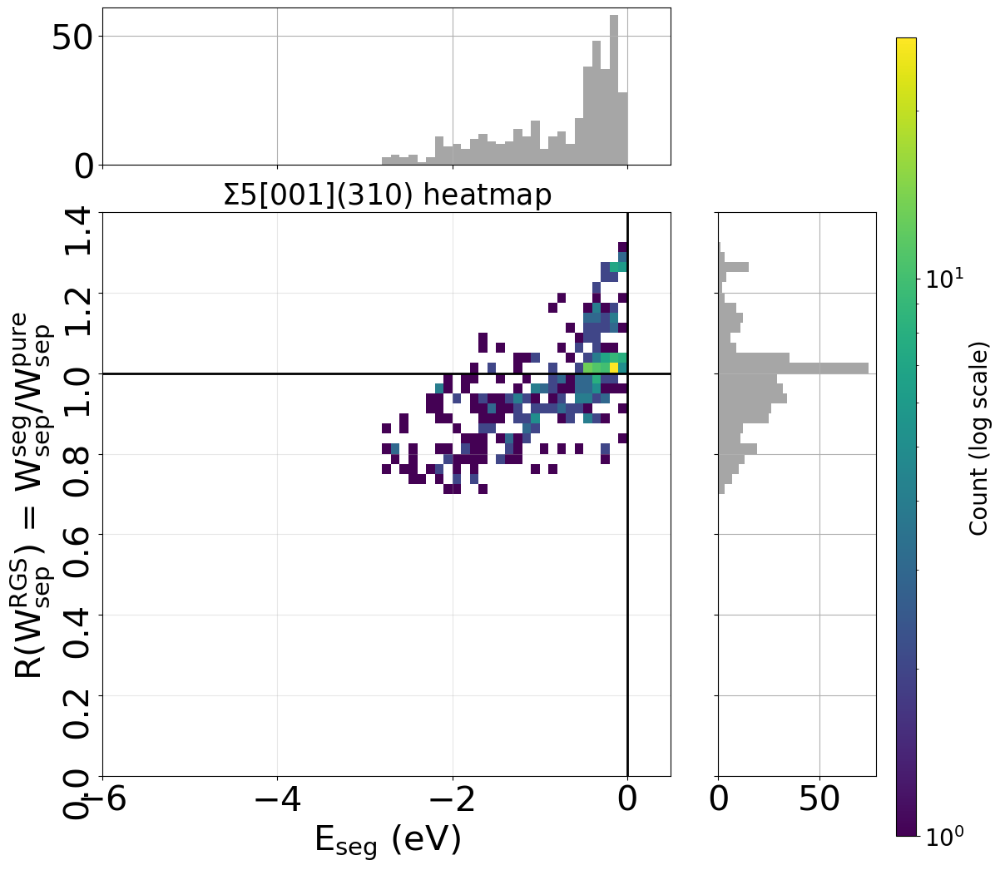

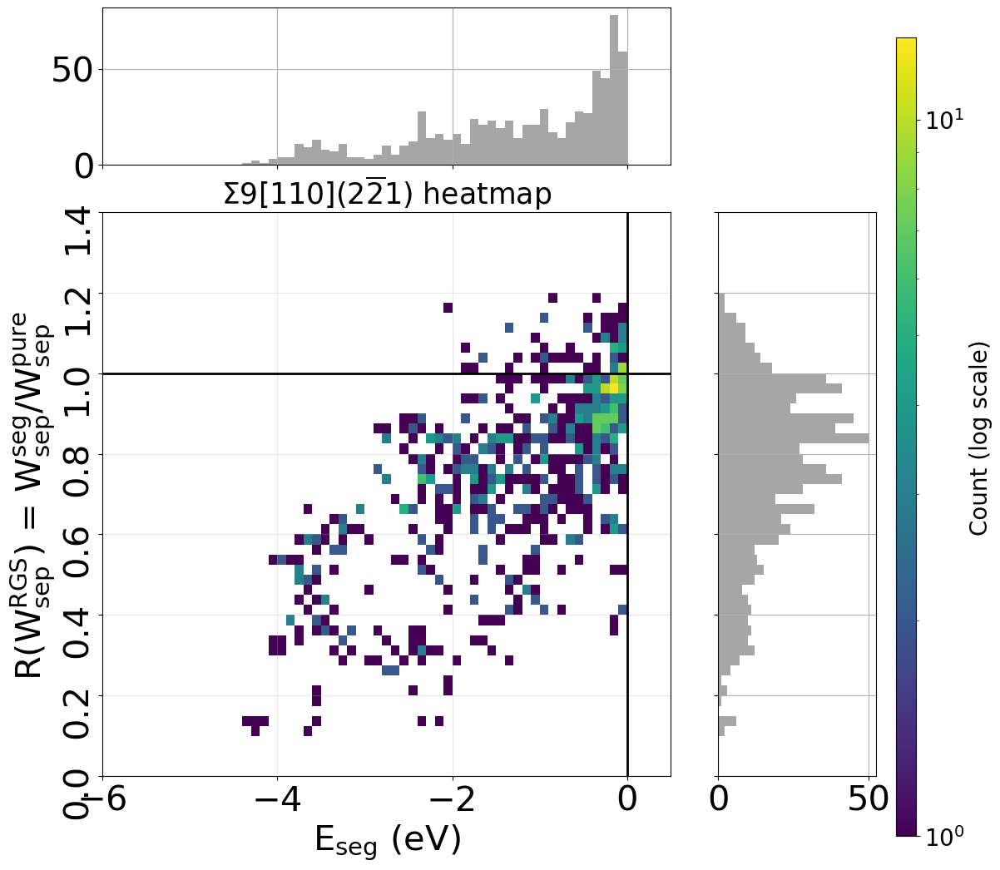

In [12]:
for gb, gb_df in df_filt.groupby("GB"):
    plot_df = gb_df[gb_df["E_seg"] < 0.5]

    fig, ax1 = plot_prop_vs_prop_with_2d_histograms(
        x_values=plot_df.E_seg.values,
        y_values=plot_df.R_Wsep_RGS.values,
        figsize=(12, 12),
        x_label=r"E$_{\rm{seg}}$ (eV)",
        x_label_fontsize=30,
        xtick_fontsize=30,
        y_label=r"R(W$_{\rm{sep}}^{\rm{RGS}}$) = W$_{\rm{sep}}^{\rm{seg}}$/W$_{\rm{sep}}^{\rm{pure}}$ ",
        y_label_fontsize=30,
        ytick_fontsize=30,
        hist_tick_fontsize=30,
        legend_posn=(-0.01, 0.62),
        colorbar_tick_fontsize=20,  # Added colorbar tick font size
        colorbar_size=[0.92, 0.05, 0.02, 0.8],  # Colorbar size [left, bottom, width, height]
        ylims=(0.00, 1.4),
        xlims=(-6, 0.5),
        x_bin_width=0.1,  # Bin width for the histograms
        y_bin_width=0.025)
    # Add vertical and horizontal lines
    ax1.axhline(1.00, linewidth=2, linestyle="-", c="k")
    ax1.axvline(0, linewidth=2, linestyle="-", c="k")

    # Set the title to indicate the current GB group
    ax1.set_title(f"{gb_latex_dict[gb]} heatmap", fontsize=25)
    write_path = f"{fig_savepath}/Figures/R_Wsep_vs_Eseg_AllSites_Heatmap_{gb}.png"
    fig.savefig(write_path, dpi=300, bbox_inches='tight', pad_inches=0.1)

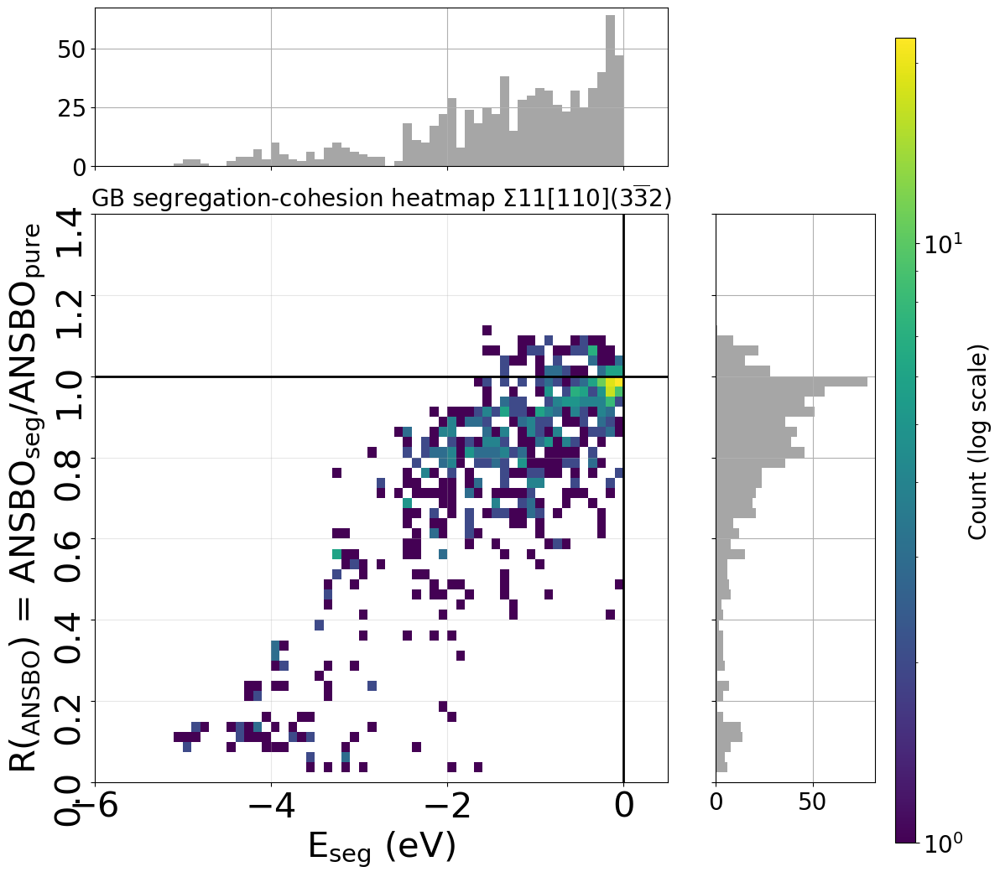

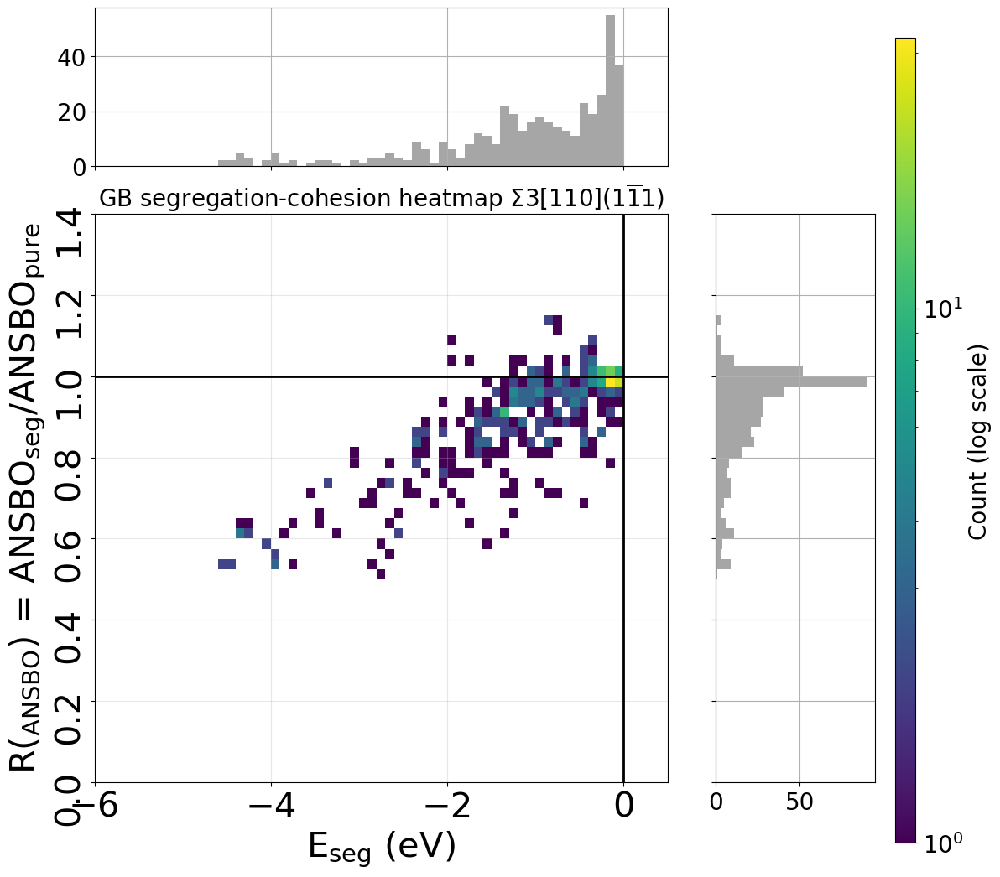

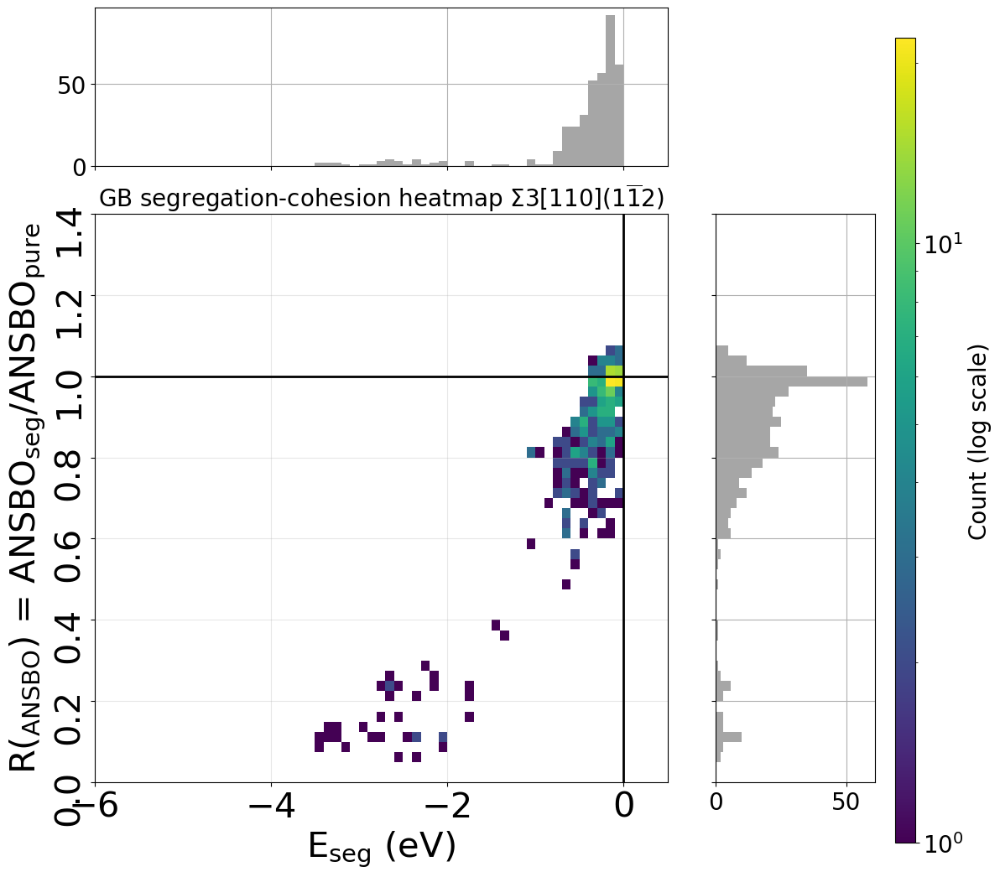

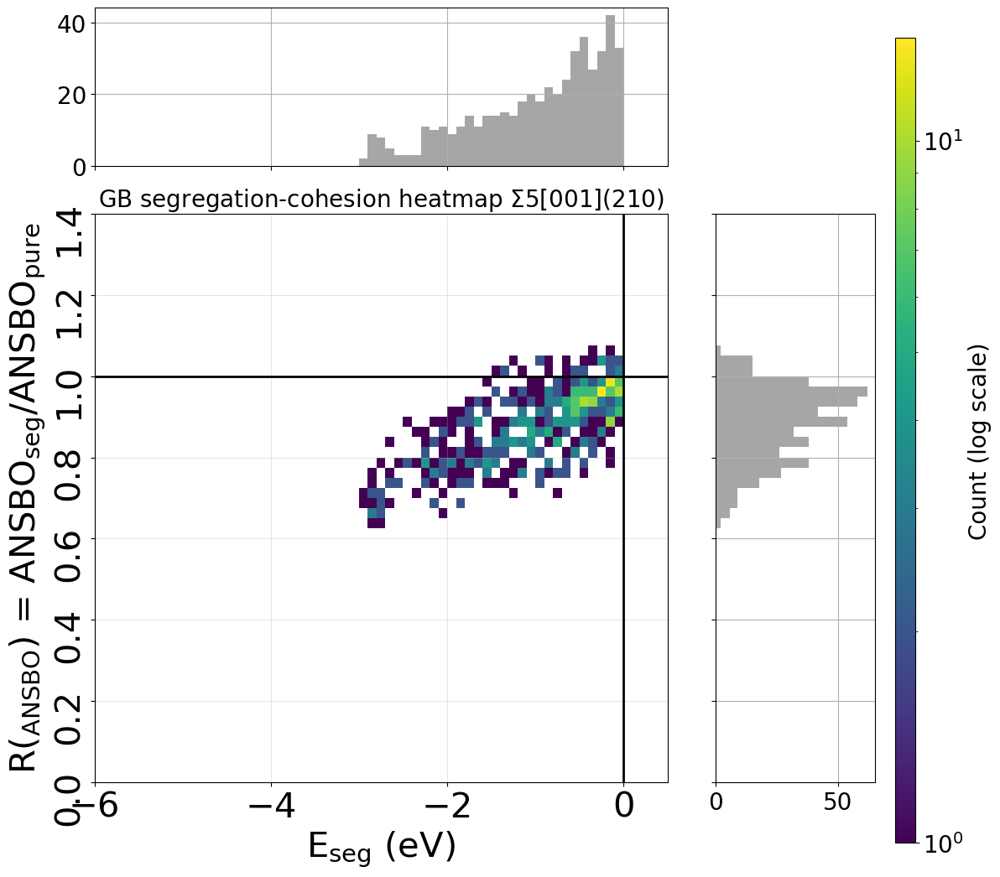

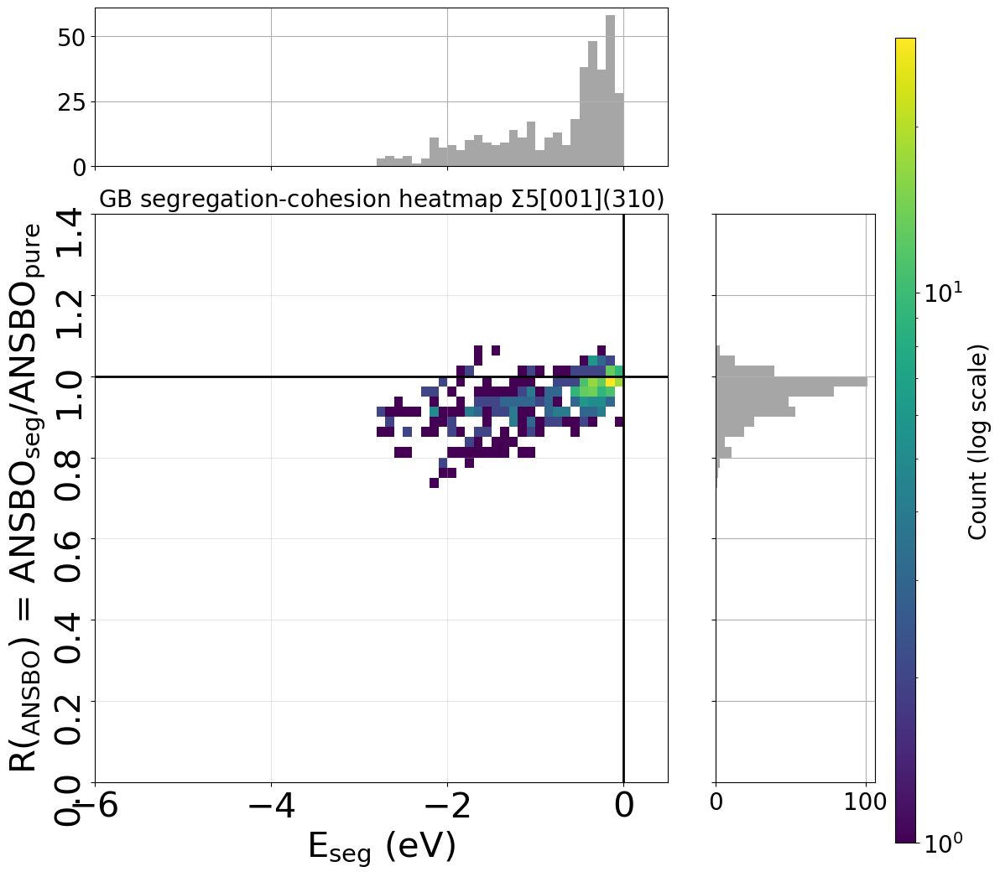

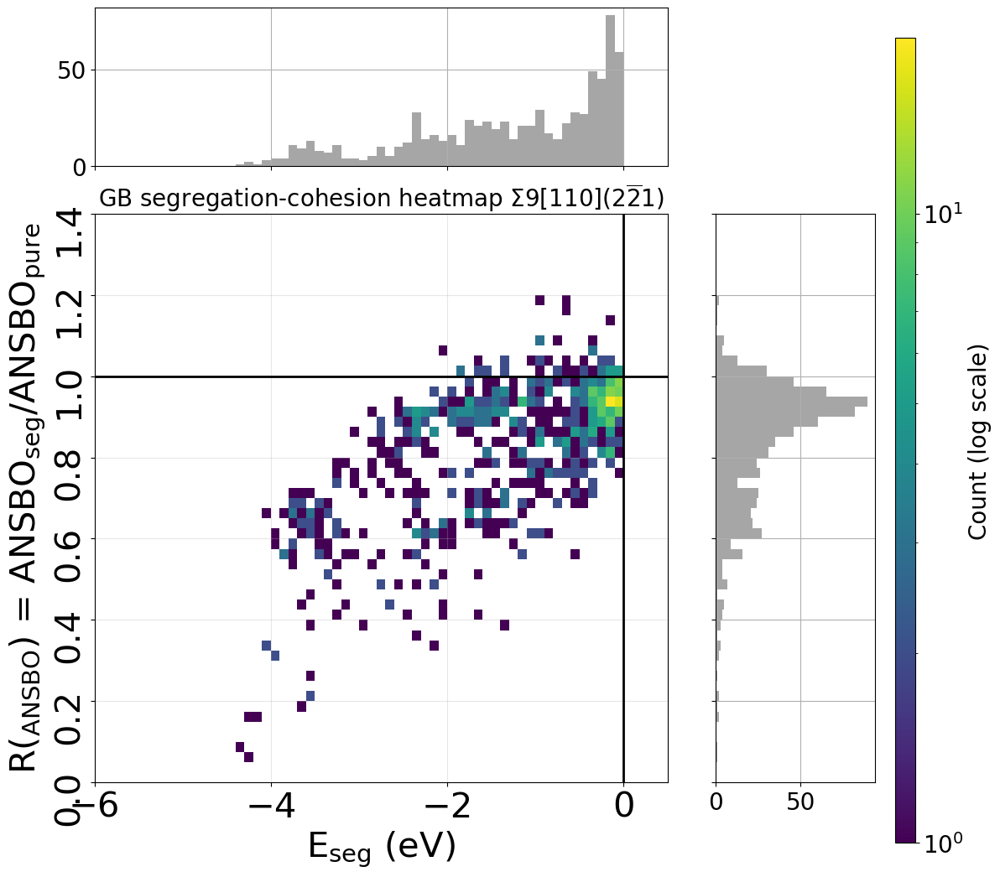

In [13]:
for gb, gb_df in df_filt.groupby("GB"):
    plot_df = gb_df[gb_df["E_seg"] < 0.5]

    fig, ax1 = plot_prop_vs_prop_with_2d_histograms(
        x_values=plot_df.E_seg.values,
        y_values=plot_df.R_DDEC6_ANSBO.values,
        figsize=(12, 12),
        x_label=r"E$_{\rm{seg}}$ (eV)",
        x_label_fontsize=30,
        xtick_fontsize=30,
        y_label=r"R($_{\rm{ANSBO}}$) = ANSBO$_{\rm{seg}}$/ANSBO$_{\rm{pure}}$",
        y_label_fontsize=30,
        ytick_fontsize=30,
        hist_tick_fontsize=20,
        legend_posn=(-0.01, 0.62),
        colorbar_tick_fontsize=20,  # Added colorbar tick font size
        colorbar_size=[0.92, 0.05, 0.02, 0.8],  # Colorbar size [left, bottom, width, height]
        ylims=(0.00, 1.4),
        xlims=(-6, 0.5),
        x_bin_width=0.1,  # Bin width for the histograms
        y_bin_width=0.025)

    # Add vertical and horizontal lines
    ax1.axhline(1.00, linewidth=2, linestyle="-", c="k")
    ax1.axvline(0, linewidth=2, linestyle="-", c="k")

    # Set the title to indicate the current GB group
    ax1.set_title(f"GB segregation-cohesion heatmap {gb_latex_dict[gb]}", fontsize=20)
    write_path = f"{fig_savepath}/Figures/R_ANSBO_vs_Eseg_AllSites_Heatmap_{gb}.png"
    fig.savefig(write_path, dpi=300, bbox_inches='tight', pad_inches=0.1)

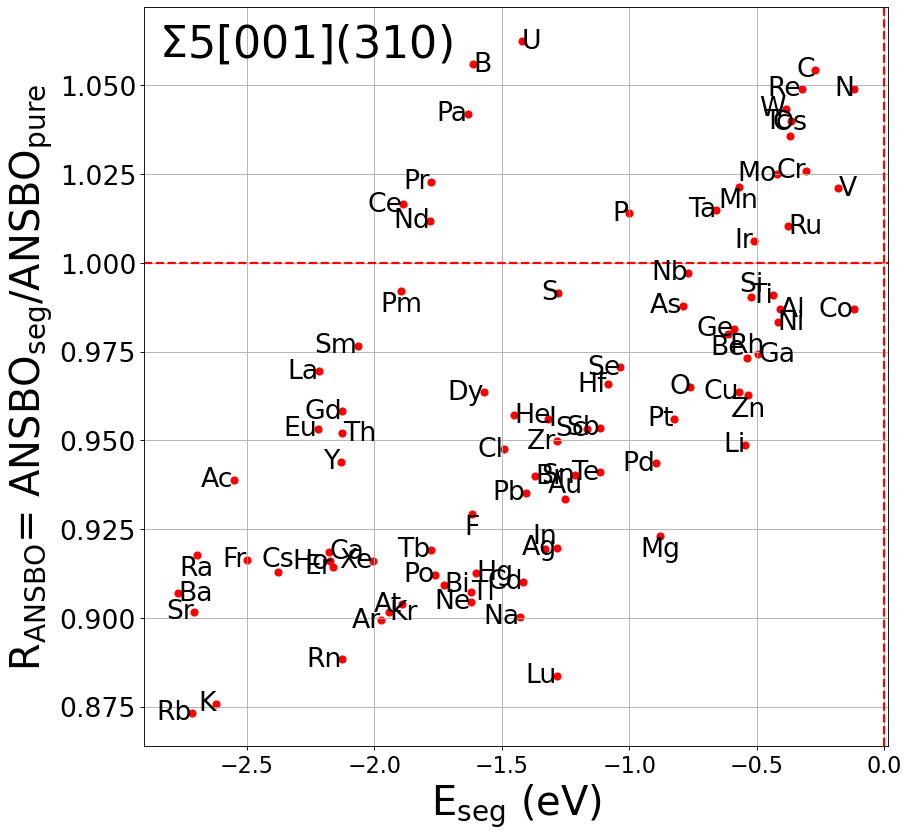

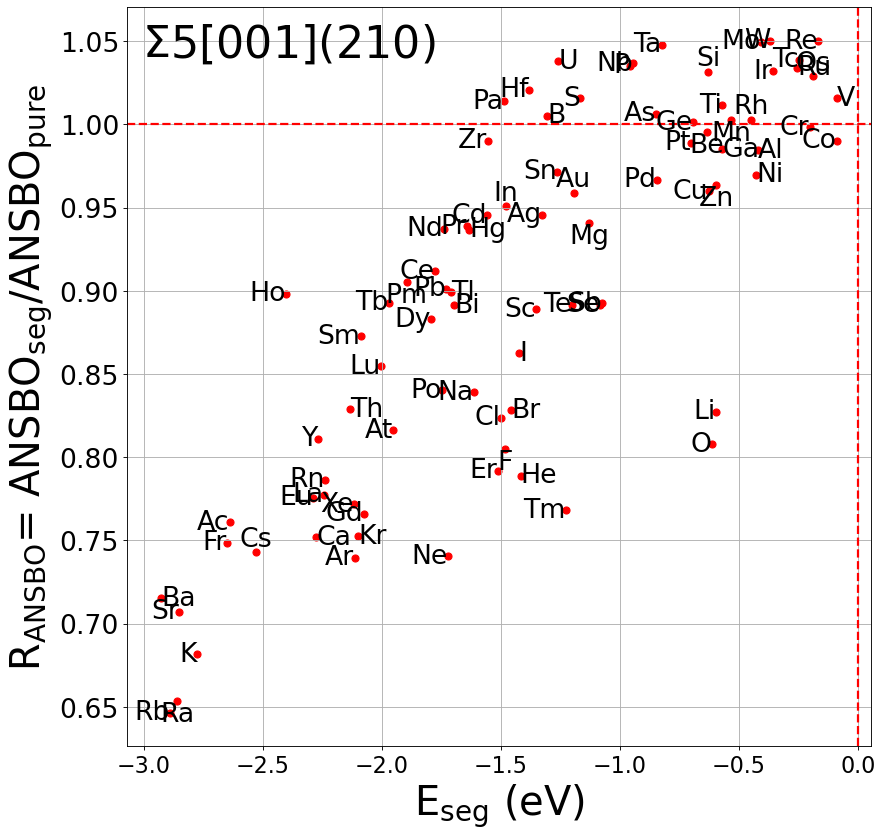

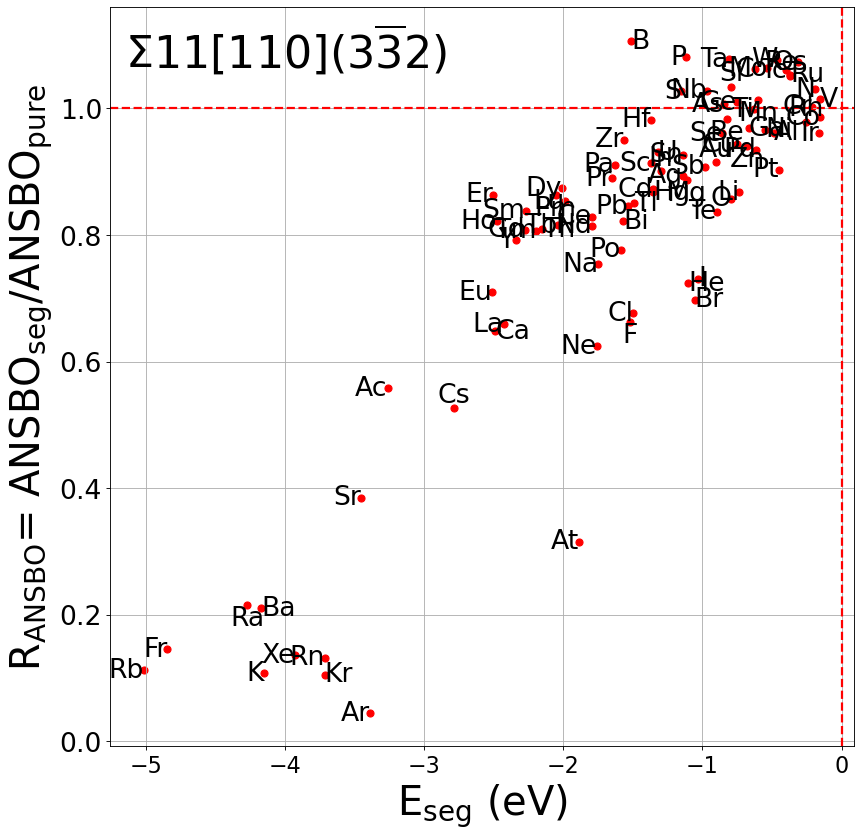

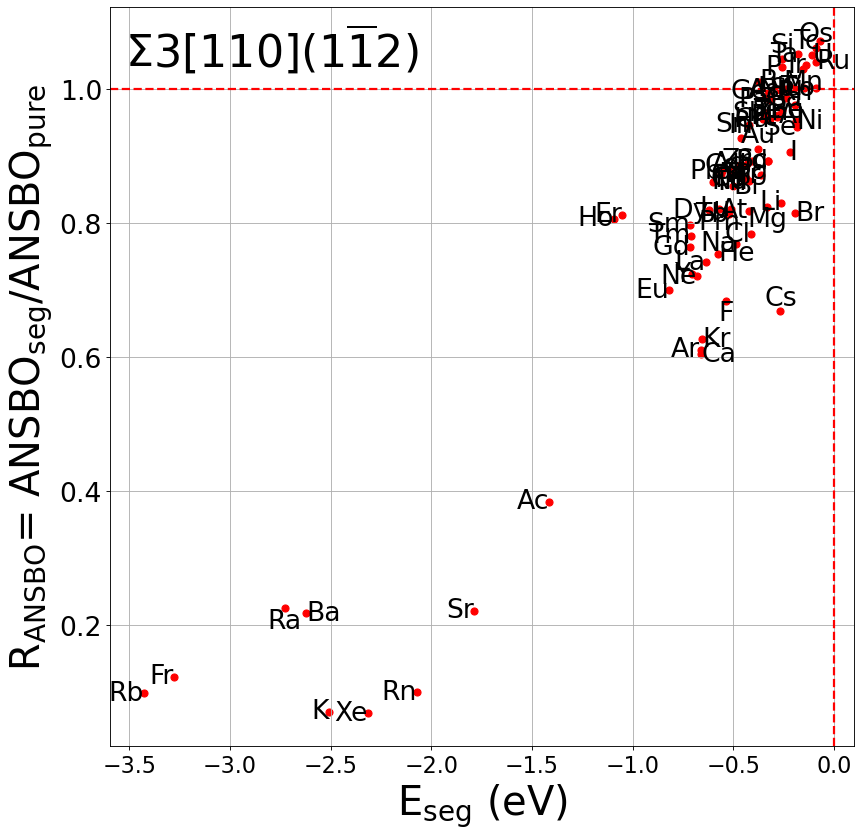

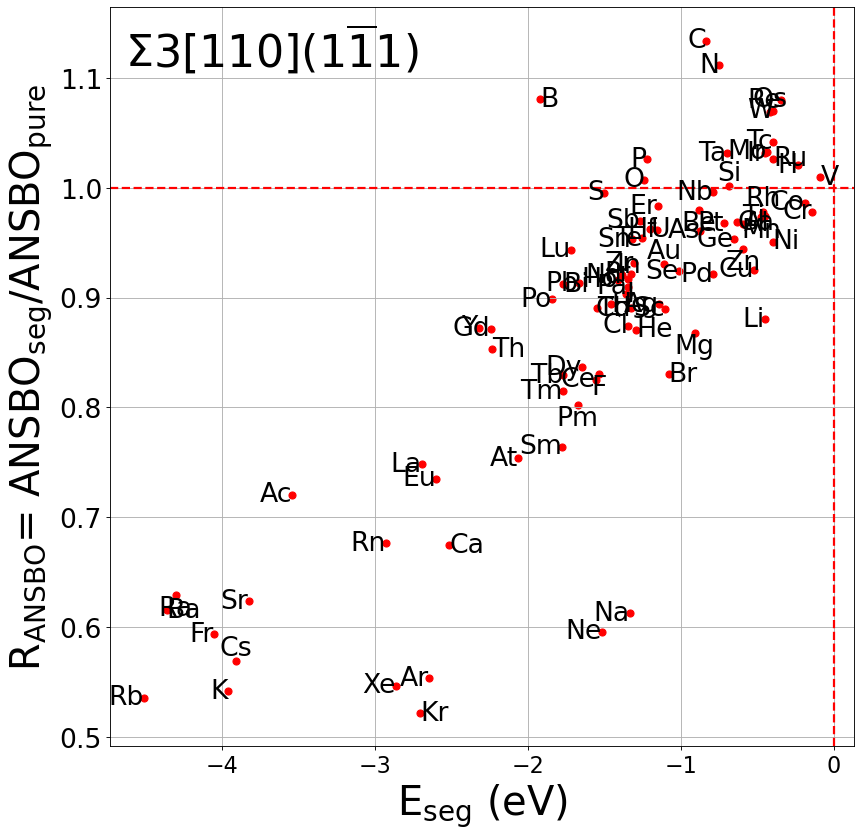

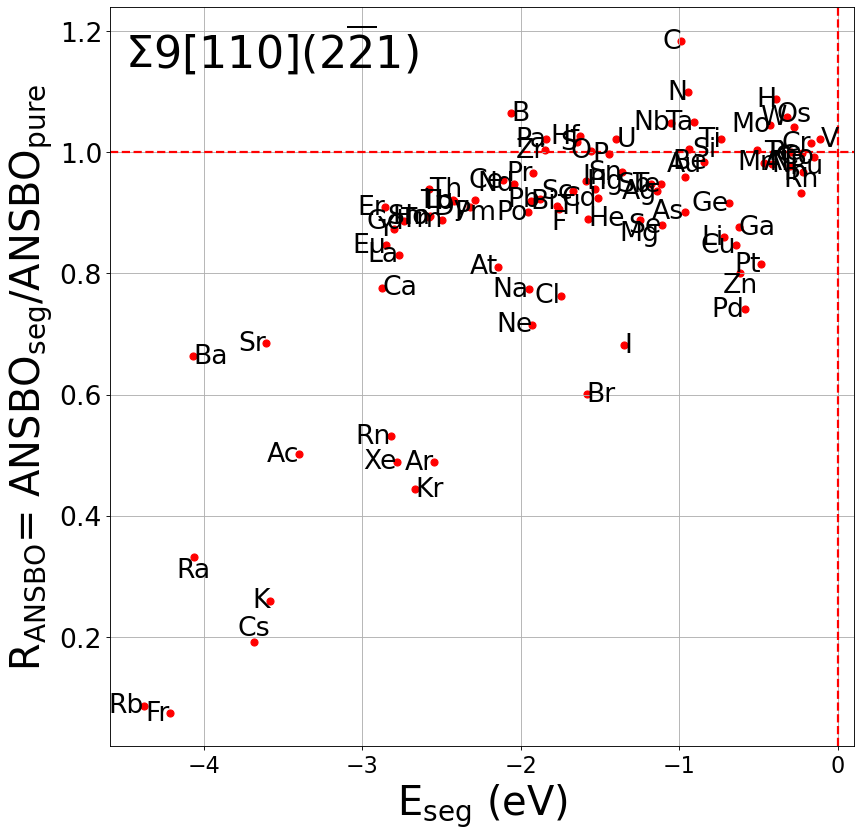

In [14]:
x_prop = "E_seg"
y_prop = "R_DDEC6_ANSBO"

for GB in ['S5_RA001_S310', 'S5_RA001_S210', 'S11_RA110_S3_32', 'S3_RA110_S1_12', 'S3_RA110_S1_11', 'S9_RA110_S2_21']:
    fig, ax = plot_prop_vs_prop_GB(df_filt,
                                gb_to_plot=GB,
                                y_prop=y_prop,
                                x_prop=x_prop,
                                ylabel=r"R$_{\rm{ANSBO}}$= ANSBO$_{\rm{seg}}$/ANSBO$_{\rm{pure}}$", 
                                xlabel=r"E$_{\rm{seg}}$ (eV)",
                                custom_colors=custom_colors,
                                gb_latex_dict=gb_latex_dict,
                                label_left=[],
                                label_right=["Ga", "Al", "U", "B", "He", "Ni", "V", "Ru", "Bi", "Ca", "Kr", "I", "Hg", "Tl", "Th", "Ba", "Br"],
                                label_bottom=["Mn", "Be", "Mg", "Ra", "F", "Pm", "Zn"],
                                label_top=["Os", "Rh", "Si", "Au", "Cs", "In"],
                                horizontal_padding=0.0002,
                                vertical_padding=0.0001)
    write_path = f"{fig_savepath}/Figures/SegregationEngineering_min_{x_prop}_vs_R_ANSBO_{GB}.png"
    fig.savefig(write_path, dpi=300, bbox_inches='tight', pad_inches=0.1)

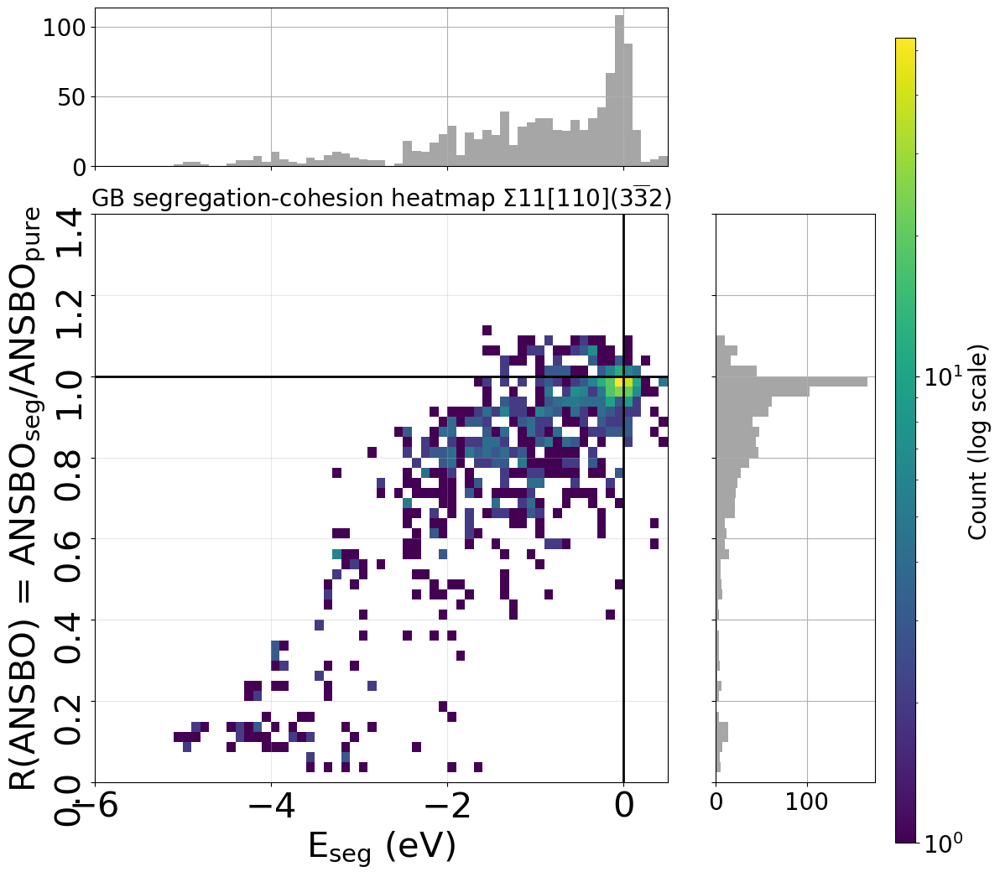

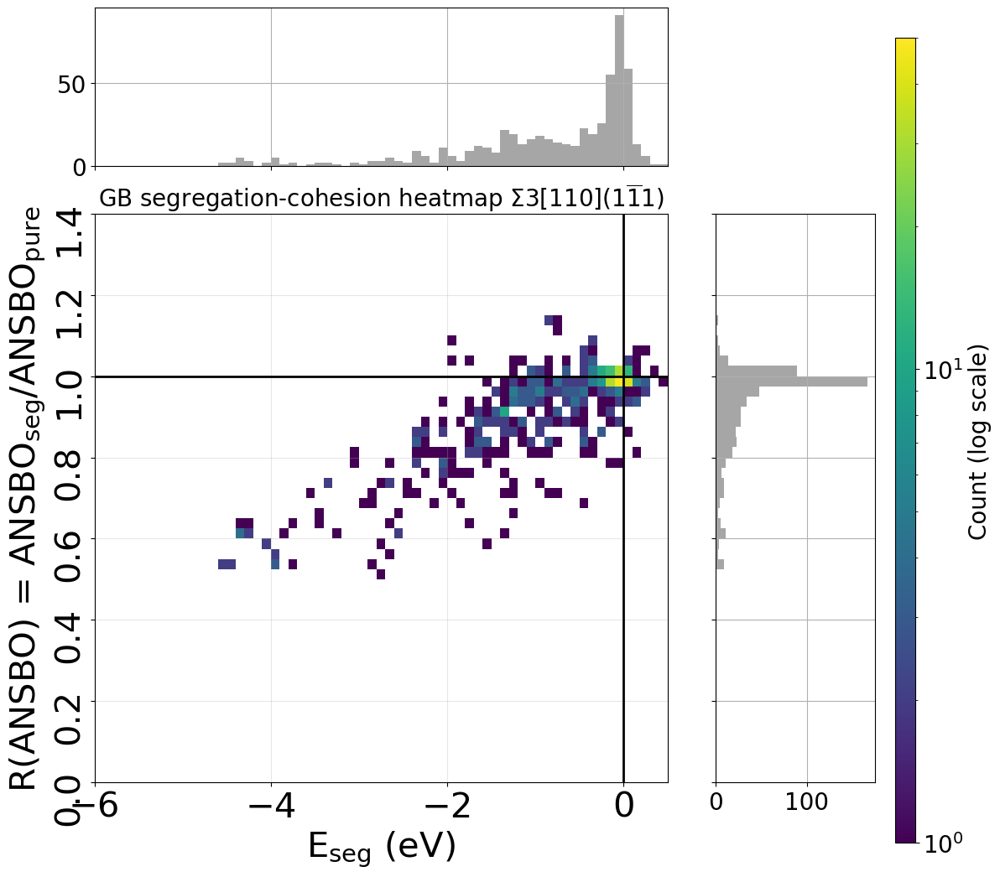

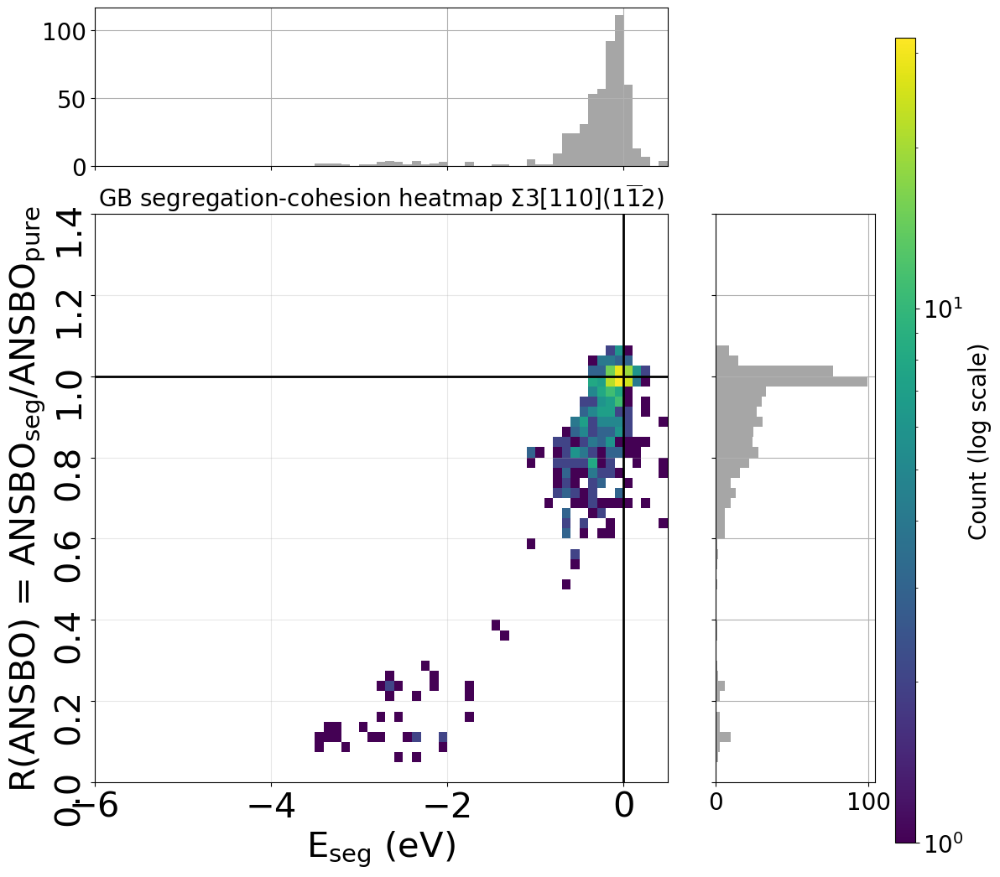

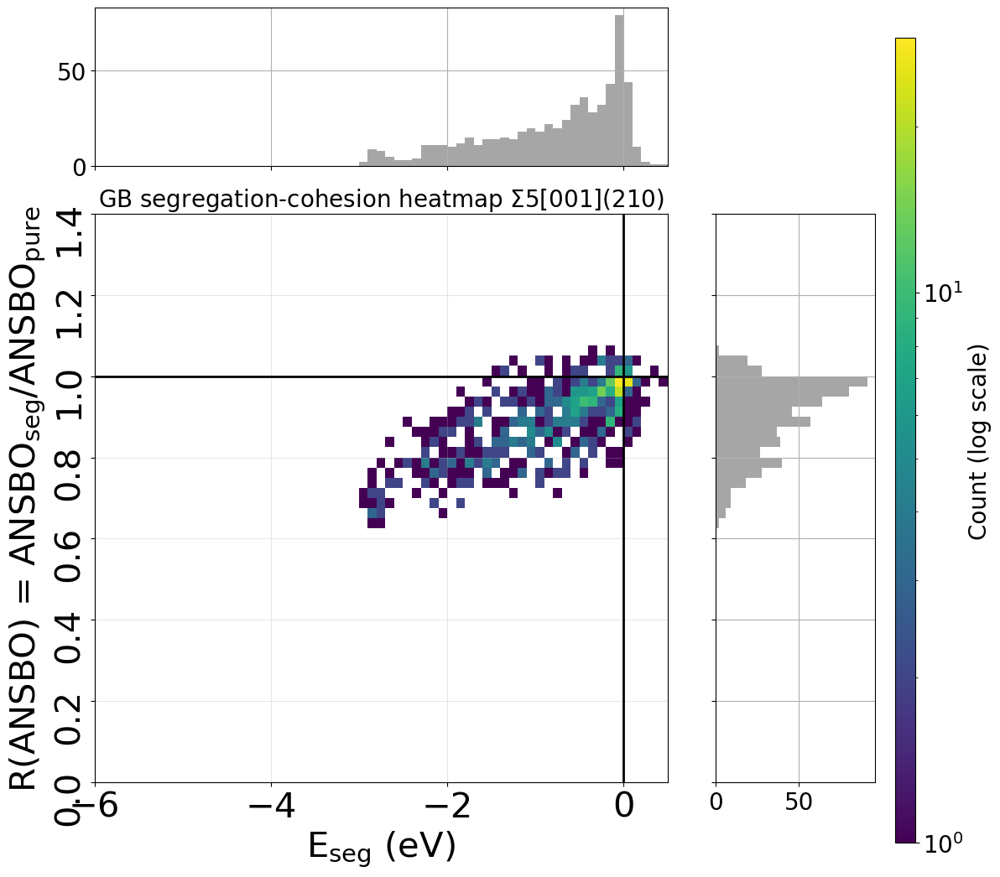

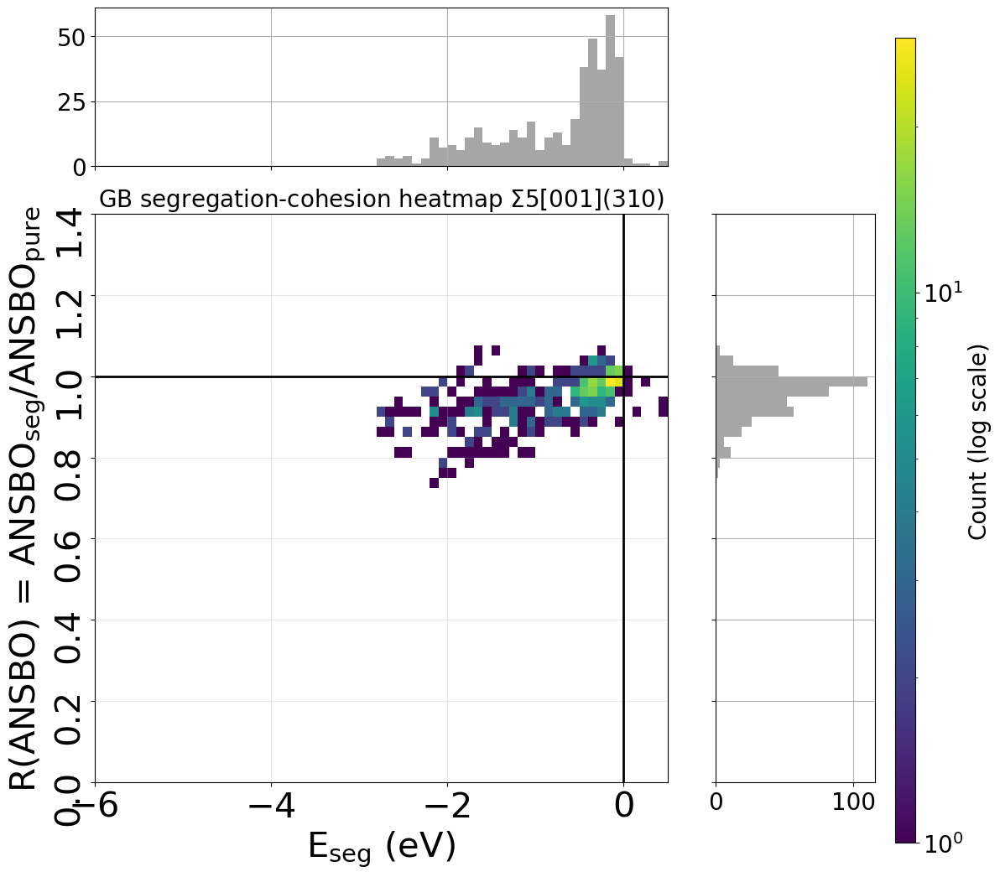

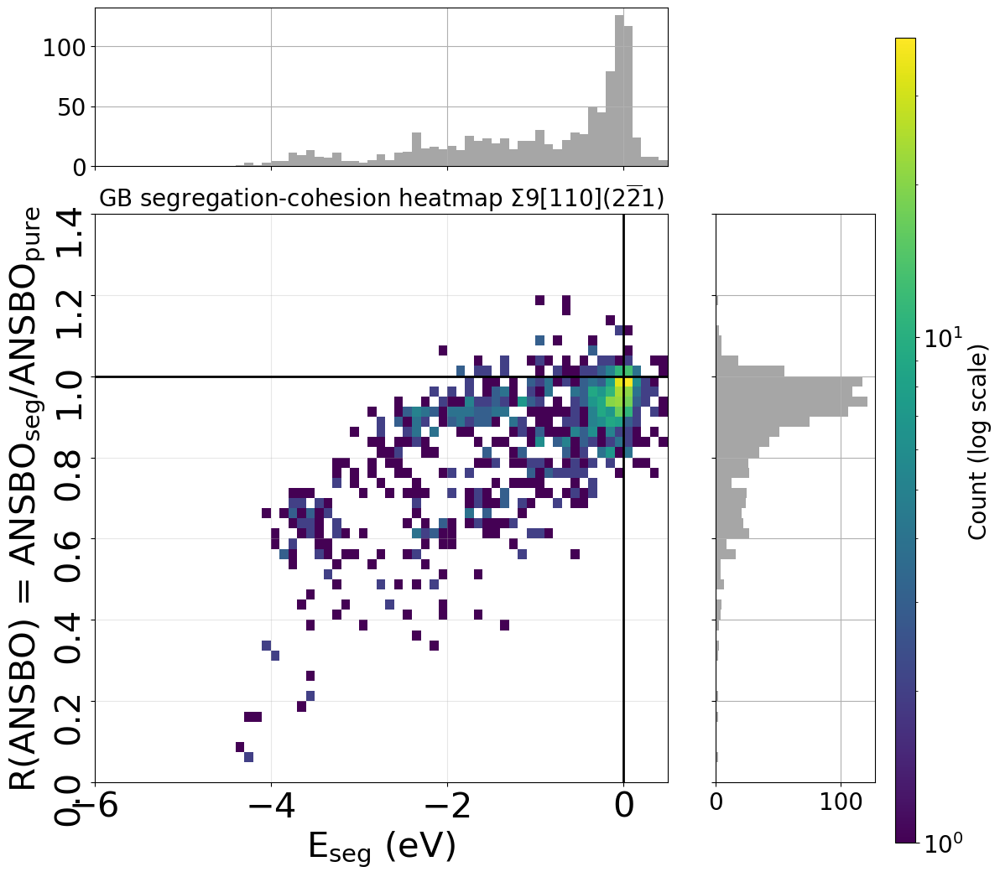

In [15]:
# Calculate the range for uniform binning and floor to align with zero
x_min, x_max = df["E_seg"].min(), df[df["E_seg"] < 0.5]["E_seg"].max()
y_min, y_max = df["R_DDEC6_ANSBO"].min(), df["R_DDEC6_ANSBO"].max()

# Floor the minimum values to the nearest lower integer and ceil the maximum values to ensure alignment
x_min = np.floor(x_min)
x_max = np.ceil(x_max)
y_min = np.floor(y_min)
y_max = np.ceil(y_max)

# Ensure that zero is aligned as a bin edge
x_min = min(x_min, 0)
y_min = min(y_min, 0)
bins=0.2
range_xy = [(x_min, x_max), (y_min, y_max)]

for gb, gb_df in df.groupby("GB"):
    plot_df = gb_df[gb_df["E_seg"] < 0.5]

    fig, ax1 = plot_prop_vs_prop_with_2d_histograms(
        x_values=plot_df.E_seg.values,
        y_values=plot_df.R_DDEC6_ANSBO.values,
        figsize=(12, 12),
        x_label=r"E$_{\rm{seg}}$ (eV)",
        x_label_fontsize=30,
        xtick_fontsize=30,
        y_label=r"R(${\rm{ANSBO}}$) = ANSBO$_{\rm{seg}}$/ANSBO$_{\rm{pure}}$",
        y_label_fontsize=30,
        ytick_fontsize=30,
        hist_tick_fontsize=20,
        legend_posn=(-0.01, 0.62),
        colorbar_tick_fontsize=20,  # Added colorbar tick font size
        colorbar_size=[0.92, 0.05, 0.02, 0.8],  # Colorbar size [left, bottom, width, height]
        ylims=(0.00, 1.4),
        xlims=(-6, 0.5),
        x_bin_width=0.1,  # Bin width for the histograms
        y_bin_width=0.025,
        range_xy=range_xy  # Pass the uniform range
)

    # Add vertical and horizontal lines
    ax1.axhline(1.00, linewidth=2, linestyle="-", c="k")
    ax1.axvline(0, linewidth=2, linestyle="-", c="k")

    # Set the title to indicate the current GB group
    ax1.set_title(f"GB segregation-cohesion heatmap {gb_latex_dict[gb]}", fontsize=20)
    write_path = f"{fig_savepath}/Figures/R_ANSBO_vs_Eseg_AllSites_Heatmap_{gb}.png"
    fig.savefig(write_path, dpi=300, bbox_inches='tight', pad_inches=0.1)


In [16]:

VorVol_Eseg_corrlist = []
magmom_Eseg_corrlist = []
VorVol_magmom_corrlist = []
element_str_list = []

for element_str, element_df in df_filt.groupby("element"):
    element_df = element_df[element_df["VorNN_tot_vol"] < 40]

    try:
        pearson_corr, _ = pearsonr(element_df.VorNN_tot_vol.values, element_df.E_seg.values)
        spearman_corr, _ = spearmanr(element_df.VorNN_tot_vol.values, element_df.E_seg.values)
    except ValueError:
        pearson_corr, spearman_corr = np.nan, np.nan
    VorVol_Eseg_corrlist.append((pearson_corr, spearman_corr))
    
    try:
        pearson_corr, _ = pearsonr(element_df.magmom_solute.values, element_df.E_seg.values)
        spearman_corr, _ = spearmanr(element_df.magmom_solute.values, element_df.E_seg.values)
    except ValueError:
        pearson_corr, spearman_corr = np.nan, np.nan
    magmom_Eseg_corrlist.append((pearson_corr, spearman_corr))
    
    try:
        pearson_corr, _ = pearsonr(element_df.VorNN_tot_vol.values, element_df.magmom_solute.values)
        spearman_corr, _ = spearmanr(element_df.VorNN_tot_vol.values, element_df.magmom_solute.values)
    except ValueError:
        pearson_corr, spearman_corr = np.nan, np.nan
    VorVol_magmom_corrlist.append((pearson_corr, spearman_corr))
    
    element_str_list.append(element_str)

corr_r_vvol_eseg = dict(zip(element_str_list, VorVol_Eseg_corrlist))
corr_r_magmom_Eseg = dict(zip(element_str_list, magmom_Eseg_corrlist))
corr_vvol_magmom = dict(zip(element_str_list, VorVol_magmom_corrlist))

bulk_df["pearson_r_vvol_eseg"] = [corr_r_vvol_eseg[row.element][0] if row.element not in ["Fe", "Yb"] else np.nan for i, row in bulk_df.iterrows()]
bulk_df["spearman_r_vvol_eseg"] = [corr_r_vvol_eseg[row.element][1] if row.element not in ["Fe", "Yb"] else np.nan for i, row in bulk_df.iterrows()]
bulk_df["pearson_r_magmom_Eseg"] = [corr_r_magmom_Eseg[row.element][0] if row.element not in ["Fe", "Yb"] else np.nan for i, row in bulk_df.iterrows()]
bulk_df["spearman_r_magmom_Eseg"] = [corr_r_magmom_Eseg[row.element][1] if row.element not in ["Fe", "Yb"] else np.nan for i, row in bulk_df.iterrows()]
bulk_df["pearson_r_vvol_magmom"] = [corr_vvol_magmom[row.element][0] if row.element not in ["Fe", "Yb"] else np.nan for i, row in bulk_df.iterrows()]
bulk_df["spearman_r_vvol_magmom"] = [corr_vvol_magmom[row.element][1] if row.element not in ["Fe", "Yb"] else np.nan for i, row in bulk_df.iterrows()]

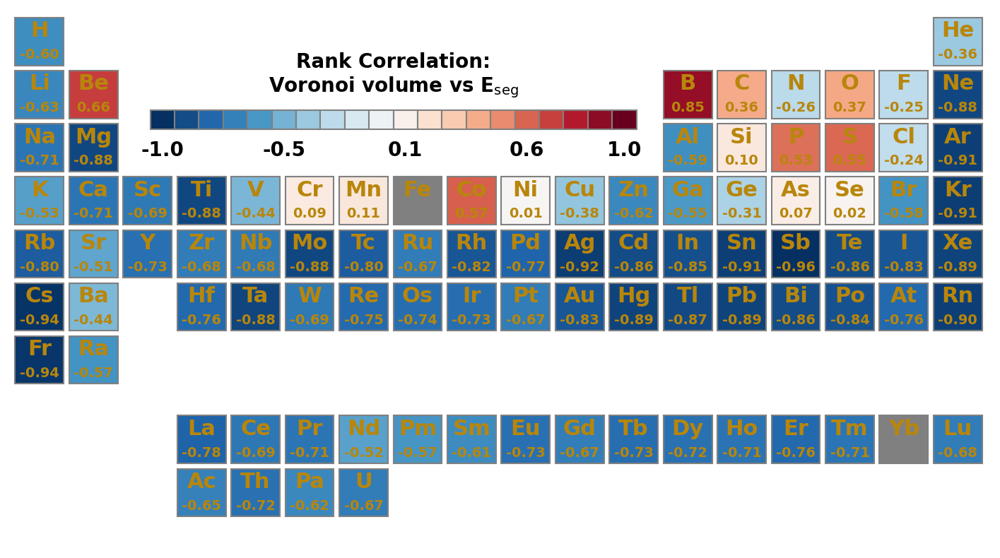

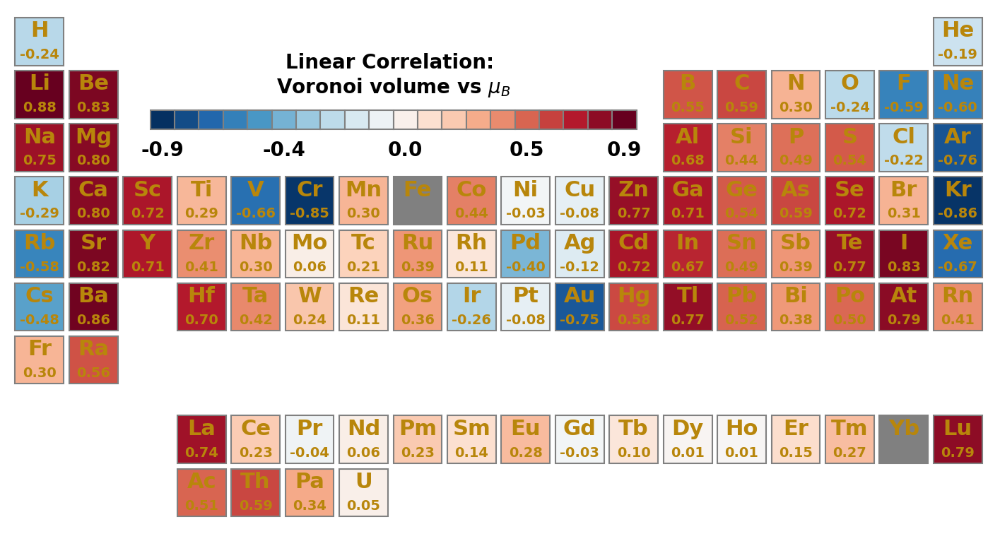

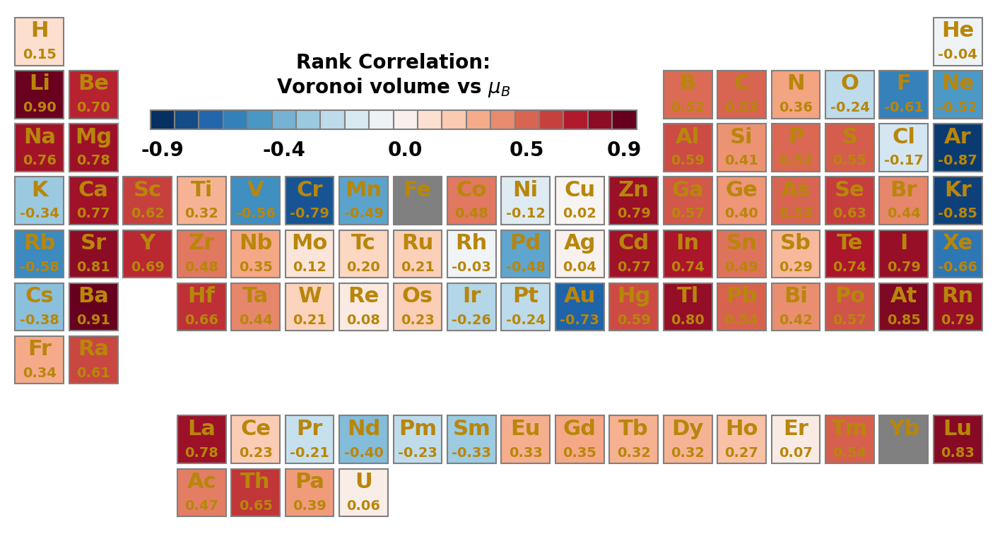

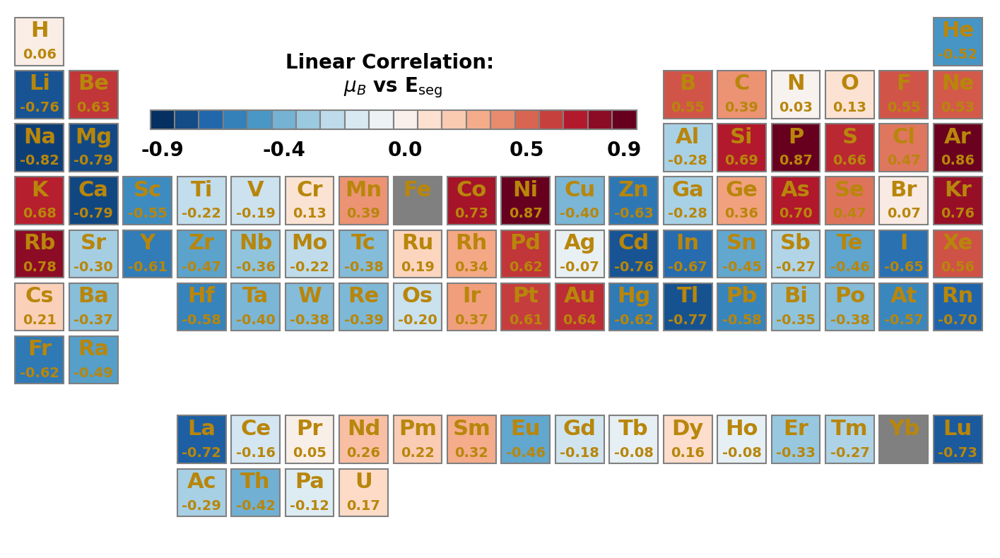

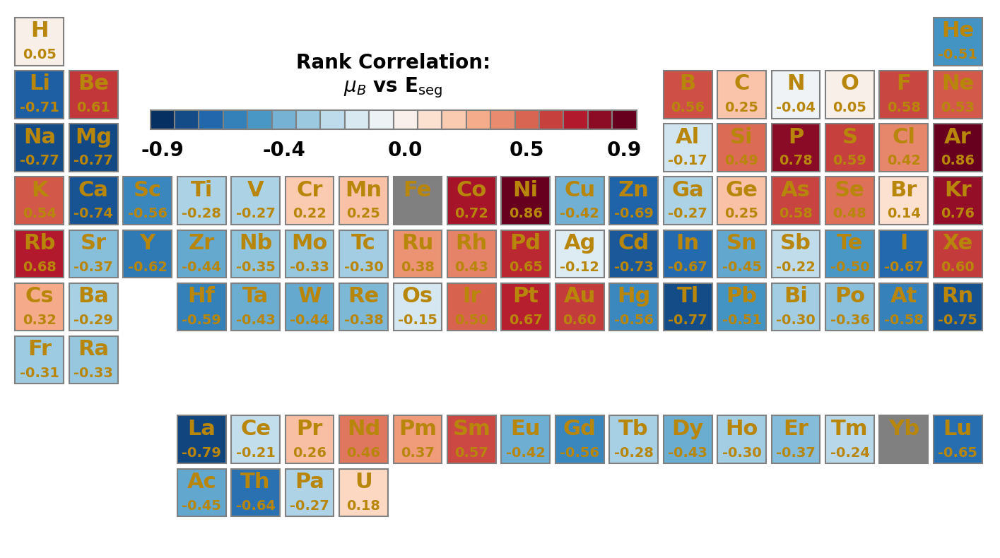

In [17]:
# Also try pearson_r_magmom_Eseg, pearson_r_vvol_magmom to see their correlations too!

fig, ax = periodic_table_plot(bulk_df,
                    "spearman_r_vvol_eseg",
                    center_cm_zero=True,
                    cmap = cm.RdBu_r,
                    property_name=r"Rank Correlation:" + "\n"+r"Voronoi volume vs E$_{\rm seg}$")
fig.savefig(f"{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_RankCorrelation_VorVol_Eseg.png", dpi=300, bbox_inches='tight', pad_inches=0.1)

fig, ax = periodic_table_plot(bulk_df,
                    "pearson_r_vvol_magmom",
                    center_cm_zero=True,
                    cmap = cm.RdBu_r,
                    property_name=r"Linear Correlation: " + "\n"+r"Voronoi volume vs $\mu_B$")
fig.savefig(f'{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_LinearCorrelation_VorVol_magmom.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

fig, ax = periodic_table_plot(bulk_df,
                    "spearman_r_vvol_magmom",
                    center_cm_zero=True,
                    cmap = cm.RdBu_r,
                    property_name=r"Rank Correlation:" + "\n"+r"Voronoi volume vs $\mu_B$")
fig.savefig(f'{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_RankCorrelation_VorVol_magmom.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

fig, ax = periodic_table_plot(bulk_df,
                    "pearson_r_magmom_Eseg",
                    center_cm_zero=True,
                    cmap = cm.RdBu_r,
                    property_name=r"Linear Correlation: " + "\n"+r"$\mu_B$ vs E$_{\rm seg}$")
fig.savefig(f'{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_LinearCorrelation_magmom_Eseg.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

fig, ax = periodic_table_plot(bulk_df,
                    "spearman_r_magmom_Eseg",
                    center_cm_zero=True,
                    cmap = cm.RdBu_r,
                    property_name=r"Rank Correlation:" + "\n"+r"$\mu_B$ vs E$_{\rm seg}$")
fig.savefig(f'{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_RankCorrelation_magmom_Eseg.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

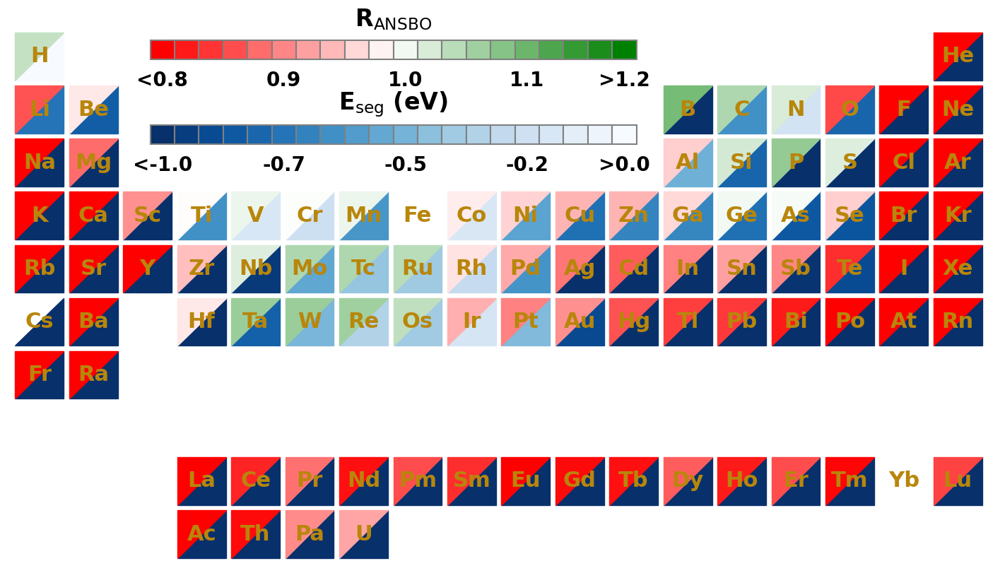

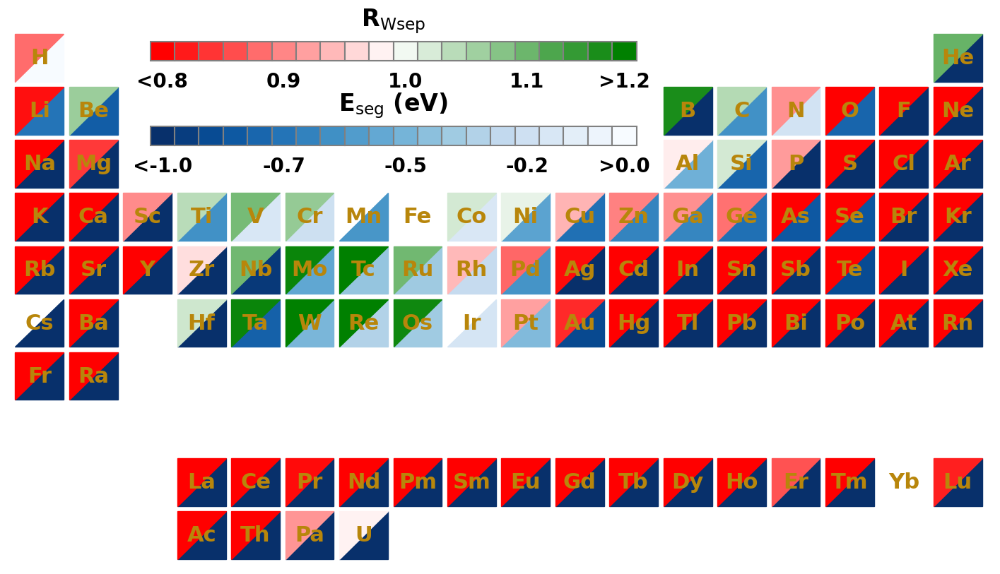

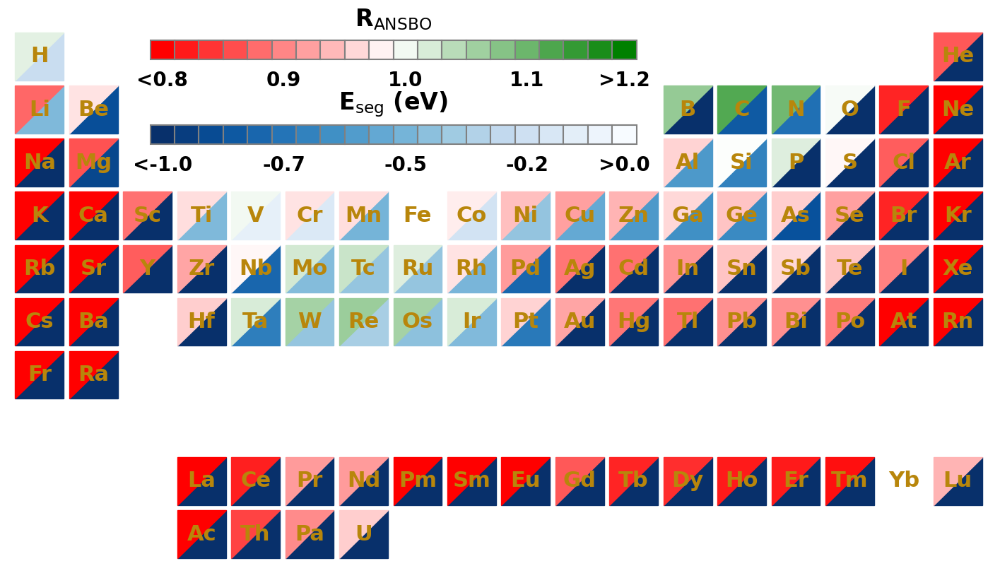

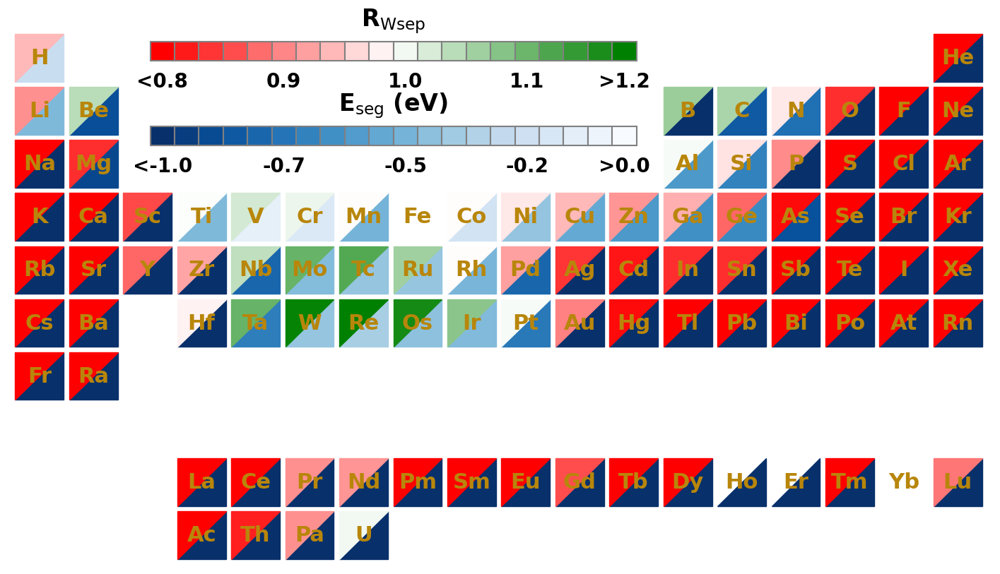

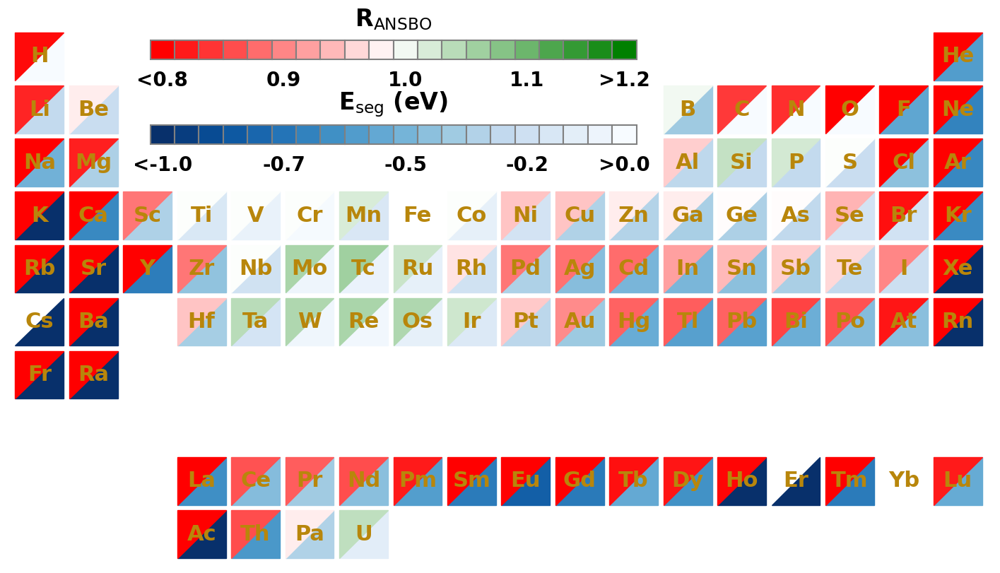

...

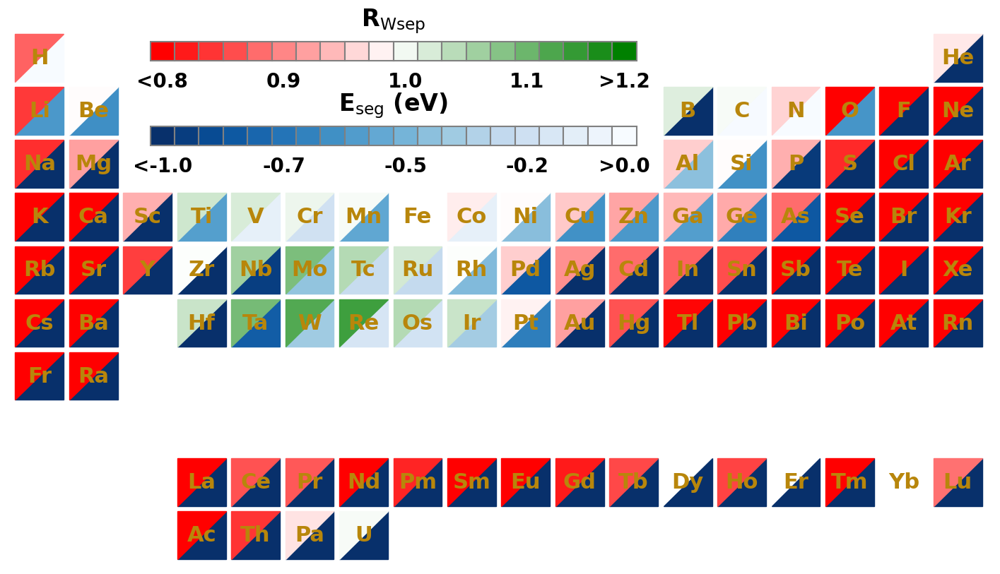

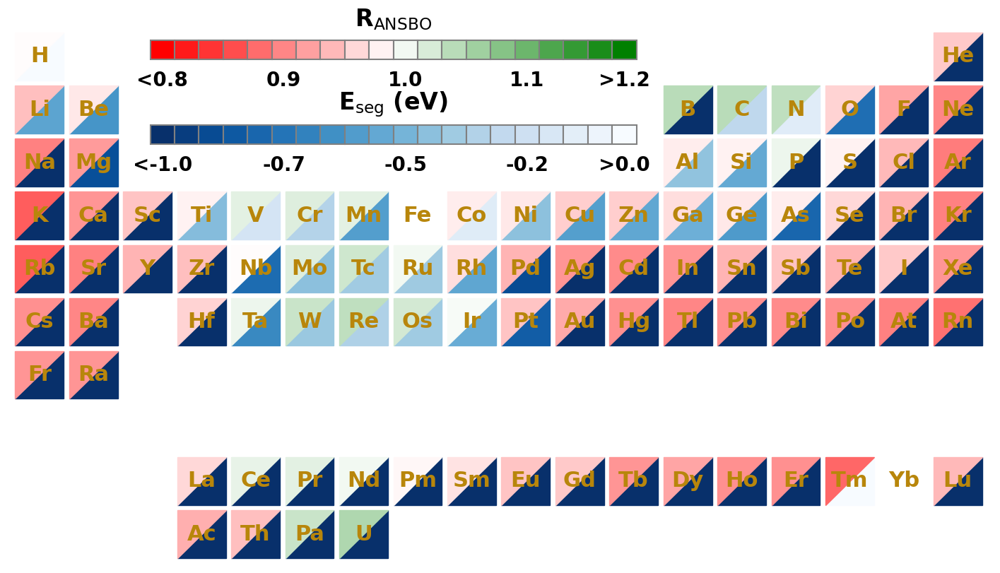

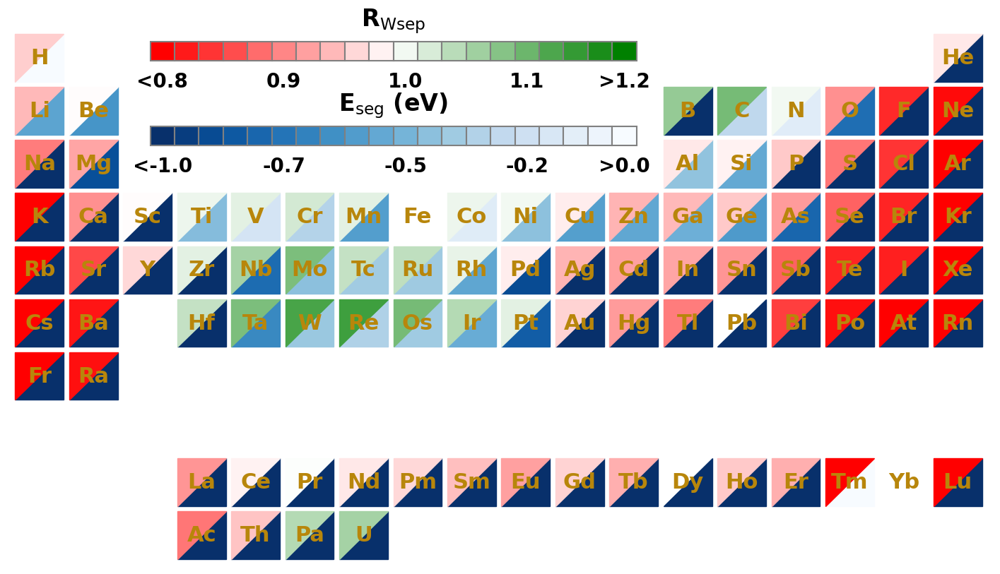

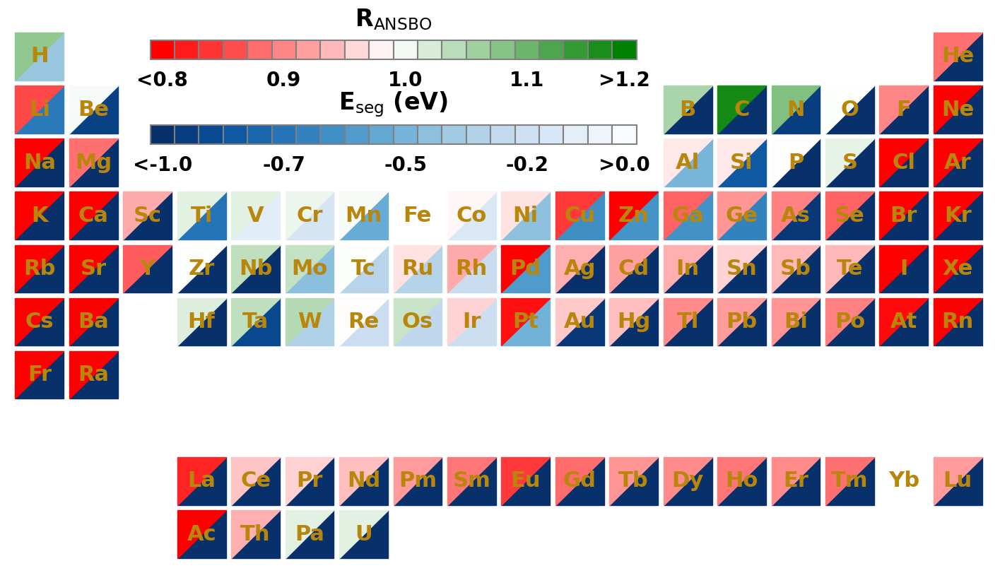

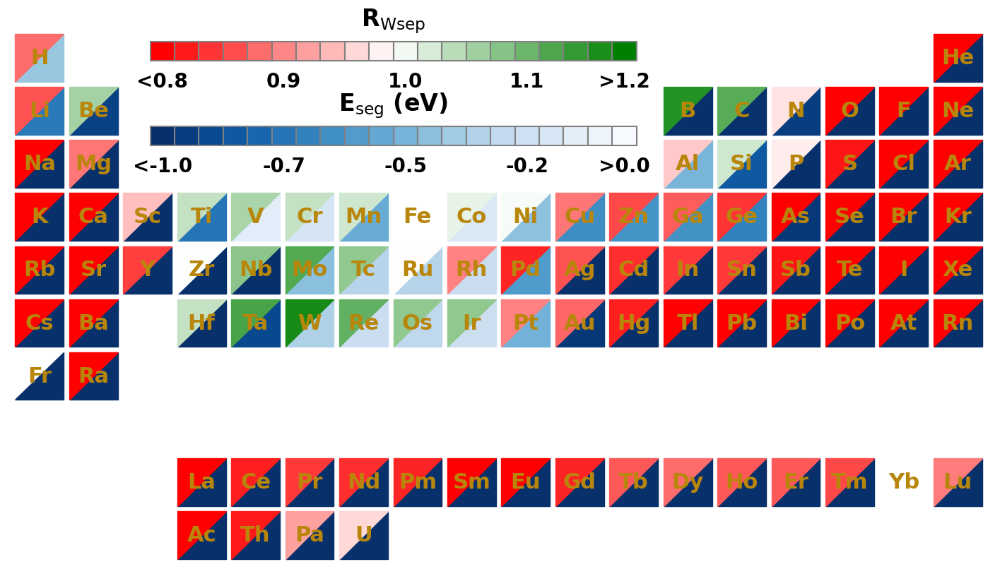

In [18]:
# Define the colors
colors = ["red", "white", "green"]  # Start with red, pass through white, end with green
n_bins = [3]  # Number of bins in each color

# Create the colormap
cmap_name = 'red_white_green'
cm_coh = LinearSegmentedColormap.from_list(cmap_name, colors, N=100)  # Increase N for smoother transitions

min_Eseg_df = []
for gb, gb_df in df.dropna(subset=['E_seg']).groupby("GB"):
    # First, find the row indices of the minimum "E_seg" within each "Element" group
    idx_min_E_seg_per_element = gb_df.groupby('element')['E_seg'].idxmin()
    # Use these indices to select the corresponding rows from the original DataFrame
    min_E_seg_GB_df = df.loc[idx_min_E_seg_per_element].reset_index(drop=True)
    min_Eseg_df.append(min_E_seg_GB_df)

min_Eseg_perGB_df = pd.concat(min_Eseg_df)
# Define the colors for the colormap (Red, White, Green)
colors = [(1, 0, 0), (1, 1, 1), (0, 1, 0)]  # R -> W -> G
n_bins = 100  # Number of bins in the colormap

for gb, gb_df in min_Eseg_perGB_df.groupby("GB"):
    fig, ax = periodic_table_dual_plot(gb_df, 
                                property1="E_seg",
                                property2="R_DDEC6_ANSBO",
                                cmap1=cm.Blues_r,
                                cmap2=cm_coh,
                                center_cm_zero1=False,
                                center_point2=1,
                                element_font_color="darkgoldenrod",
                                count_min1 = -1,
                                count_max1 = 0,
                                count_min2 = 0.8,
                                count_max2 = 1.2,
                                property_name1=r"E$_{\rm{seg}}$ (eV)",
                                property_name2 = r"R$_{\rm{ANSBO}}$")
    fig.savefig(f'{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_segregation_engineering_ANSBO_bounded_{gb}.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    fig, ax = periodic_table_dual_plot(gb_df, 
                                property1="E_seg",
                                property2="R_Wsep_RGS",
                                cmap1=cm.Blues_r,
                                cmap2=cm_coh,
                                center_cm_zero1=False,
                                center_point2=1,
                                element_font_color="darkgoldenrod",
                                property_name1=r"E$_{\rm{seg}}$ (eV)",
                                property_name2 = r"R$_{\rm{Wsep}}$",
                                count_min1 = -1,
                                count_max1 = 0,
                                count_min2 = 0.8,
                                count_max2 = 1.2
                                )
    fig.savefig(f'{fig_savepath}/Figures/Ptable_Correlation_Plots/Ptable_segregation_engineering_Wsep_bounded_{gb}.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


## Summed bond order in the bulk 

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


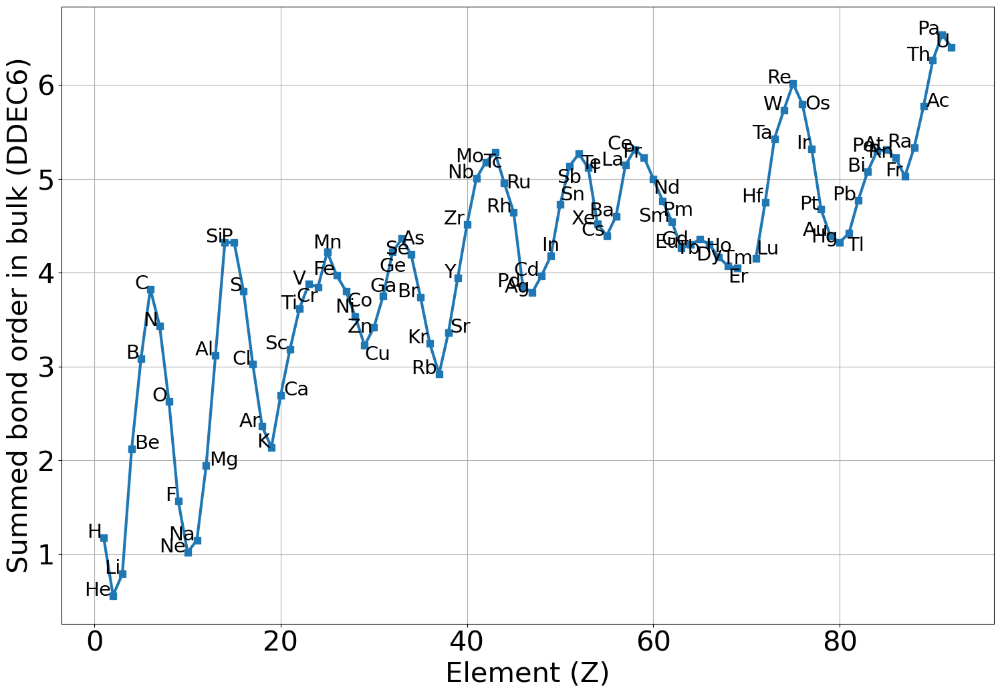

In [19]:
column = "summed_DDEC6_bond_order"
# Plotting column against 'Z'
plt.figure(figsize=(18, 12))
plt.plot(bulk_df['Z'], bulk_df[column], marker='s', linewidth = 3, markersize=7)

# Adding a horizontal line
# plt.axhline(y=11.356932331342922, color='r', linestyle='--', label='Fe BCC bulk')
# plt.text(92, 11.356932331342922-0.2, "Fe BCC = 11.35 Å³", fontsize=30, ha='right')

#Labeling points on the plot below each point
element_fontsize = 21
for idx, row in bulk_df.iterrows():
    if row.element == "Mg":
        plt.text(row['Z']+0.3, row[column], row['element'], fontsize=element_fontsize, ha='left')
    elif row.element == "Be":
        plt.text(row['Z']+0.3, row[column], row['element'], fontsize=element_fontsize, ha='left')
    elif row.element == "Ca":
        plt.text(row['Z']+0.3, row[column], row['element'], fontsize=element_fontsize, ha='left')
    elif row.element == "V":
        plt.text(row['Z']-0.3, row[column], row['element'], fontsize=element_fontsize, ha='right')
    elif row.element == "Cr":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, va='top', ha="right")
    elif row.element == "Mn":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, va='bottom', ha="center")
    elif row.element == "Co":
        plt.text(row['Z']+0.1, row[column]-0.01, row['element'], fontsize=element_fontsize, va='top')
    elif row.element == "Cu":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, va='top')
    elif row.element == "Ni":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, va='bottom', ha="right")
    elif row.element == "Zn":
        plt.text(row['Z']-0.1, row[column], row['element'], fontsize=element_fontsize, va='center', ha="right")
    elif row.element == "Ga":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, va='bottom', ha='center')
    elif row.element == "Ge":
        plt.text(row['Z'], row[column]-0.05, row['element'], fontsize=element_fontsize, va='top', ha='center')
    elif row.element == "As":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='left', va="center")
    elif row.element == "Sr":
        plt.text(row['Z']+0.2, row[column], row['element'], fontsize=element_fontsize, ha='left')
    elif row.element == "Tc":
        plt.text(row['Z']-0.2, row[column], row['element'], fontsize=element_fontsize, ha='center', va="top")
    elif row.element == "Ru":
        plt.text(row['Z']+0.2, row[column], row['element'], fontsize=element_fontsize, ha='left', va='center')
    elif row.element == "In":
        plt.text(row['Z'], row[column]+0.05, row['element'], fontsize=element_fontsize, ha='center')
    elif row.element == "Sn":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='left', va='bottom')
    elif row.element == "Sb":
        plt.text(row['Z'], row[column]-0.02, row['element'], fontsize=element_fontsize, ha='center', va="top")
    elif row.element == "Te":
        plt.text(row['Z']+0.2, row[column], row['element'], fontsize=element_fontsize, ha='left', va="top")
    elif row.element == "I":
        plt.text(row['Z']+0.4, row[column], row['element'], fontsize=element_fontsize, ha='left', va="center")
    elif row.element == "Nd":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='left', va='top')
    elif row.element == "Pm":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='left', va='top')
    elif row.element == "Tb":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='right', va="top")
    elif row.element == "Dy":
        plt.text(row['Z'], row[column]-0.015, row['element'], fontsize=element_fontsize, ha='center', va="top")
    elif row.element == "Ho":
        plt.text(row['Z'], row[column]+0.015, row['element'], fontsize=element_fontsize, ha='center', va="bottom")
    elif row.element == "Er":
        plt.text(row['Z'], row[column]-0.015, row['element'], fontsize=element_fontsize, ha='left', va="top")
    elif row.element == "Tm":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='center', va="bottom")
    elif row.element == "Lu":
        plt.text(row['Z'], row[column], row['element'], fontsize=element_fontsize, ha='left', va="bottom")
    elif row.element == "Os":
        plt.text(row['Z']+0.3, row[column], row['element'], fontsize=element_fontsize, ha='left', va="center")
    elif row.element == "Tl":
        plt.text(row['Z']-0.2, row[column]-0.03, row['element'], fontsize=element_fontsize, va='top')
    elif row.element == "Ac":
        plt.text(row['Z']+0.3, row[column], row['element'], fontsize=element_fontsize, ha='left')
    else:
        plt.text(row['Z']-0.2, row[column], row['element'], fontsize=element_fontsize, ha='right')

# Adding labels, title, and grid
plt.xlabel("Element (Z)", fontsize=30)
plt.ylabel("Summed bond order in bulk (DDEC6)", fontsize=30)
# plt.title(columnvs Atomic Number (Z)", fontsize=24)
plt.grid(True)
# Adjusting tick size
plt.tick_params(axis='x', labelsize=30)  # Adjust x-tick label size
plt.tick_params(axis='y', labelsize=30)  # Adjust x-tick label size
plt.savefig(f'{fig_savepath}/Figures/BondOrderBulk_vs_Z.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

In [34]:
df_ele = df[(df["element"] == "C") & (df["E_seg"] < 0) & (df["dist_GB"] < 3.5) & (df["convergence"] == True)]
df_ele

,job_name,structure,GB,element,site,Z,E_seg,magmoms,convergence,GB_site,...,VorNN_vertices_min_unrel,VorNN_vertices_max_unrel,VorNN_areas_std_unrel,VorNN_areas_mean_unrel,VorNN_areas_min_unrel,VorNN_areas_max_unrel,VorNN_distances_std_unrel,VorNN_distances_mean_unrel,VorNN_distances_min_unrel,VorNN_distances_max_unrel
149,S11_RA110_S3_32_C_16,"{""@module"": ""pymatgen.core.structure"", ""@class...",S11_RA110_S3_32,C,16,6,-0.570308,"[2.863, 2.634, 2.378, 2.499, 2.286, 2.328, 2.2...",True,S11_RA110_S3_32-16,...,4.0,6.0,0.845201,1.912651,0.802757,2.796851,0.104429,1.308276,1.179289,1.460540
151,S11_RA110_S3_32_C_18,"{""@module"": ""pymatgen.core.structure"", ""@class...",S11_RA110_S3_32,C,18,6,-0.245610,"[2.859, 2.643, 2.384, 2.498, 2.264, 2.323, 2.2...",True,S11_RA110_S3_32-18,...,4.0,6.0,0.976275,1.923422,0.423041,3.042402,0.138944,1.320805,1.160308,1.588653
153,S11_RA110_S3_32_C_20,"{""@module"": ""pymatgen.core.structure"", ""@class...",S11_RA110_S3_32,C,20,6,-0.231678,"[2.855, 2.637, 2.37, 2.498, 2.255, 2.312, 2.24...",True,S11_RA110_S3_32-20,...,4.0,6.0,1.057186,1.940777,0.000267,3.286178,0.199011,1.347017,1.144045,1.792847
1110,S3_RA110_S1_11_C_32,"{""@module"": ""pymatgen.core.structure"", ""@class...",S3_RA110_S1_11,C,32,6,-0.583726,"[2.824, 2.824, 2.301, 2.304, 2.461, 2.468, 2.2...",True,S3_RA110_S1_11-32,...,4.0,6.0,1.094413,1.683677,0.002024,3.167329,0.218897,1.431877,1.193569,1.812306
1111,S3_RA110_S1_11_C_34,"{""@module"": ""pymatgen.core.structure"", ""@class...",S3_RA110_S1_11,C,34,6,-0.837275,"[2.823, 2.826, 2.304, 2.3, 2.471, 2.465, 2.281...",True,S3_RA110_S1_11-34,...,4.0,6.0,0.880864,2.498658,1.243722,4.035193,0.087802,1.254633,1.097710,1.370598
2258,S5_RA001_S210_C_33,"{""@module"": ""pymatgen.core.structure"", ""@class...",S5_RA001_S210,C,33,6,-0.006960,"[2.858, 2.852, 2.654, 2.654, 2.628, 2.628, 2.2...",True,S5_RA001_S210-33,...,4.0,6.0,1.079725,2.065623,0.000009,4.119274,0.213850,1.381737,1.152894,1.904071
2862,S5_RA001_S310_C_33,"{""@module"": ""pymatgen.core.structure"", ""@class...",S5_RA001_S310,C,33,6,-0.005802,"[2.86, 2.862, 2.665, 2.671, 2.918, 2.932, 2.66...",True,S5_RA001_S310-33,...,4.0,6.0,1.028122,1.992783,0.045093,3.163822,0.176863,1.347905,1.212723,1.899536
2863,S5_RA001_S310_C_37,"{""@module"": ""pymatgen.core.structure"", ""@class...",S5_RA001_S310,C,37,6,-0.270312,"[2.853, 2.853, 2.67, 2.666, 2.926, 2.926, 2.66...",True,S5_RA001_S310-37,...,4.0,7.0,1.282917,1.913708,0.002566,4.661651,0.245703,1.409766,1.121835,1.891022
2864,S5_RA001_S310_C_40,"{""@module"": ""pymatgen.core.structure"", ""@class...",S5_RA001_S310,C,40,6,-0.071576,"[2.858, 2.852, 2.659, 2.659, 2.934, 2.932, 2.6...",True,S5_RA001_S310-40,...,3.0,7.0,0.765192,2.093217,0.758063,2.993841,0.092788,1.347112,1.262863,1.489506
3396,S9_RA110_S2_21_C_30,"{""@module"": ""pymatgen.core.structure"", ""@class...",S9_RA110_S2_21,C,30,6,-0.972492,"[2.847, 2.615, 2.636, 2.349, 2.471, 2.276, 2.2...",True,S9_RA110_S2_21-30,...,4.0,6.0,1.048438,1.963765,0.438897,3.236930,0.151486,1.337035,1.169228,1.631528


In [35]:
x = "E_seg"
y = "R_DDEC6_ANSBO"
areas = {}
for GB, GB_df in df_ele.groupby("GB"):
    structure = Structure.from_str(GB_df.iloc[0].structure, fmt="json")
    areas[GB] = structure.volume/structure.lattice.c/100 # nm^2 not Ang^2
# Remove rows where either x or y is NaN
df_ele = df_ele.dropna(subset=[x, y])

df_ele[f"full_multiplicity_{x}"] = [[row[x]] * int(np.round(row.site_multiplicity / areas[row.GB])) for _, row in df_ele.iterrows()]
df_ele[f"full_multiplicity_{y}"] = [[row[y]] * int(np.round(row.site_multiplicity / areas[row.GB])) for _, row in df_ele.iterrows()]

In [36]:
df_ele.full_multiplicity_E_seg

# Collect all data first to define global bin edges
for gb_type, marker in gb_marker_dict.items():
    print(gb_type)
    gb_df = df_ele[df_ele['GB'] == gb_type].dropna()
    if len(gb_df) == 0:
        print(gb_df)
        continue
    plot_x = np.concatenate(gb_df[f"full_multiplicity_{x}"].explode().dropna().apply(np.ravel).tolist())
    plot_y = np.concatenate(gb_df[f"full_multiplicity_{y}"].explode().dropna().apply(np.ravel).tolist())

S3_RA110_S1_11
S3_RA110_S1_12
Empty DataFrame
Columns: [job_name, structure, GB, element, site, Z, E_seg, magmoms, convergence, GB_site, structure_unrel, E_seg_unrel, magmoms_unrel, DDEC6_ANSBO_atomic_layers, DDEC6_ANSBO_cleavage_coords, DDEC6_ANSBO_profile, DDEC6_ANSBO_within_range, DDEC6_min_ANSBO, pure_ca_results, pure_DDEC6_ANSBO_atomic_layers, pure_DDEC6_ANSBO_cleavage_coords, pure_DDEC6_ANSBO_profile, pure_DDEC6_ANSBO_within_range, pure_DDEC6_min_ANSBO, total_energy, convergence_pureGB, total_energy_pureGB, magmoms_pureGB, GB_element_site, Wsep_RGS_list, cleavage_planes, cp_names, Wsep_RGS_min, pure_cleavage_planes, pure_cleavage_energies, pure_min_wsep_rigid, site_z, solute_idx, equivalent_sites, site_multiplicity, dist_GB, magmom_solute, Wsep_RGS_cleavage_planes, Wsep_RGS_min_pure, DDEC6_ANSBO_min, R_Wsep_RGS, R_Wsep_RGS_lst, R_DDEC6_ANSBO, R_DDEC6_ANSBO_lst, ANSBO_Wsep_RGS_corr_vals, site_z_unrel, dist_GB_unrel, magmom_solute_unrel, VorNN_CoordNo, VorNN_tot_vol, VorNN_tot_area

In [32]:
plot_x

array([-0.57030804, -0.57030804, -0.57030804, -0.57030804, -0.57030804,
       -0.24561048, -0.24561048, -0.24561048, -0.24561048, -0.24561048,
       -0.23167771, -0.23167771, -0.23167771, -0.23167771, -0.23167771])

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

props = ["R_DDEC6_ANSBO", "R_Wsep_RGS", "eta_min_ANSBO", "eta_min_Wsep_RGS", "DDEC6_min_ANSBO", "Wsep_RGS_min"]
prop_labels = [
    #r"$\rm{R}_{\rm{ANSBO}}$", 
    r"R(${\rm{ANSBO}}$)",
    r"$\rm{R}_{\rm{W}_{\rm{sep}}}$", 
    r"$\eta_{\rm{ANSBO}}$ (ANSBO)", 
    r"$\eta_{\rm{W}_{\rm{sep}}}$ (J/m$^2$)", 
    "DDEC6 ANSBO", 
    r"W$_{\rm{sep}}$ (J/m$^2$)"
]
prop_label_dict = dict(zip(props, prop_labels))
x_prop = "E_seg"
ptable = pd.read_csv("FeGB_PtableSeg/periodic_table.csv")
for y_prop in [props[0], props[1]]:
    for element in df.element.unique():
        df_ele = df[(df["element"] == element) & (df["E_seg"] < 0) & (df["dist_GB"] < 3.5) & (df["convergence"] == True)].copy()
        if len(df_ele) == 0:
            continue
        #print(element, len(df_ele))
        fig, ax = plot_x_y_whist_spectra(df=df_ele,
                            x=x_prop,
                            y=y_prop,
                            xlabel=r"$\rm{E}_{\rm{seg}}$ (eV)",
                            ylabel=prop_label_dict[y_prop],
                            xlabel_fontsize=40,
                            ylabel_fontsize=40,
                            legend_fontsize=14,
                            bin_width_x=0.05,
                            bin_width_y=0.01,
                            hist_ticksize=16,
                            title=element,
                            title_fontsize=40,
                            mask_limits=None)
        _ = ax.axhline(y=1.0, color="r", linestyle="--")
        _ = ax.axvline(x=0, color="r", linestyle="--")
        if y_prop == "R_Wsep_RGS":
            fig.savefig(f"{fig_savepath}/Figures/Elemental_segregation_vs_cohesion_maps_new/SegregationEngineering_{element}_E_seg_vs_R_wsep.png", dpi=300, bbox_inches='tight', pad_inches=0.1)
        else:
            fig.savefig(f"{fig_savepath}/Figures/Elemental_segregation_vs_cohesion_maps_new/SegregationEngineering_{element}_E_seg_vs_R_ANSBO.png", dpi=300, bbox_inches='tight', pad_inches=0.1)
        plt.close(fig)

Ac 33
Ag 33
Al 32
Ar 33
As 33
At 33
Au 32
B 25
Ba 35
Be 28
Bi 33
Br 30
C 13
Ca 33
Cd 33
Ce 34
Cl 31
Co 25
Cr 23
Cs 26
Cu 33
Dy 28
Er 20
Eu 33
F 35
Fr 33
Ga 32
Gd 33
Ge 33
H 5
He 33
Hf 31
Hg 33
Ho 24
I 31
In 33
Ir 25
K 37
Kr 33
La 33
Li 31
Lu 33
Mg 32
Mn 28
Mo 21
N 7
Na 33
Nb 30
Nd 32
Ne 33
Ni 32
O 18
Os 21
P 30
Pa 32
Pb 33
Pd 32
Pm 32
Po 33
Pr 30
Pt 31
Ra 34
Rb 35
Re 18
Rh 29
Rn 32
Ru 23
S 30
Sb 33
Sc 33
Se 30
Si 32
Sm 31
Sn 33
Sr 37
Ta 24
Tb 31
Tc 24
Te 31
Th 33
Ti 25
Tl 33
Tm 18
U 32
V 16
W 19
Xe 33
Y 33
Zn 33
Zr 32
Ac 33
Ag 33
Al 32
Ar 33
As 33
At 33
Au 32
B 25
Ba 35
Be 28
Bi 33
Br 30
C 13
Ca 33
Cd 33
Ce 34
Cl 31
Co 25
Cr 23
Cs 26
Cu 33
Dy 28
Er 20
Eu 33
F 35
Fr 33
Ga 32
Gd 33
Ge 33
H 5
He 33
Hf 31
Hg 33
Ho 24
I 31
In 33
Ir 25
K 37
Kr 33
La 33
Li 31
Lu 33
Mg 32
Mn 28
Mo 21
N 7
Na 33
Nb 30
Nd 32
Ne 33
Ni 32
O 18
Os 21
P 30
Pa 32
Pb 33
Pd 32
Pm 32
Po 33
Pr 30
Pt 31
Ra 34
Rb 35
Re 18
Rh 29
Rn 32
Ru 23
S 30
Sb 33
Sc 33
Se 30
Si 32
Sm 31
Sn 33
Sr 37
Ta 24
Tb 31
Tc 24
Te 31
Th 33
Ti 25
Tl

# Bonding in chargemol vs calculated Wsep

Text(0, 0.5, 'R')

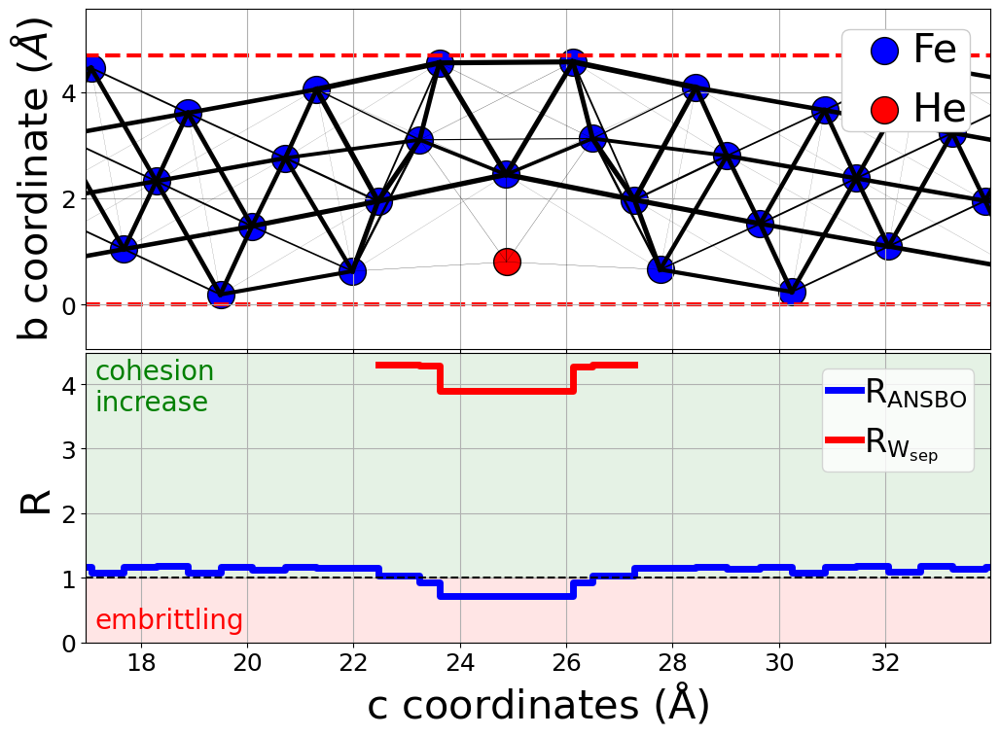

In [ ]:
from FeGB_PtableSeg.chargemol import ChargemolAnalysis, get_ANSBO_all_cleavage_planes, get_unique_values_in_nth_value

# Need atomic layers from the original dataframe.

def closest_interval_index(cleavage_plane, atomic_layers):
    """Find the closest interval index for the cleavage plane."""
    # Find index of closest lower or equal atomic layer
    idx = np.searchsorted(atomic_layers, cleavage_plane, side='right') - 1
    if idx < 0 or idx >= len(atomic_layers) - 1:
        return None
    return idx
df['R_Wsep_RGS_lst_aligned'] = None   
for idx, row in df.iterrows():
    try:
        # Number of intervals is one less than the number of atomic layer points
        num_intervals = len(row['DDEC6_ANSBO_atomic_layers']) - 1
        aligned_values = [np.nan] * num_intervals  # Initialize with NaNs
        for plane, wsep_value in zip(row['Wsep_RGS_cleavage_planes'], row['R_Wsep_RGS_lst']):
            interval_index = closest_interval_index(plane, row['DDEC6_ANSBO_atomic_layers'])
            if interval_index is not None and interval_index < num_intervals:
                aligned_values[interval_index] = wsep_value
    except:
        num_intervals = np.nan
        aligned_values = np.nan
    
    df.at[idx, 'R_Wsep_RGS_lst_aligned'] = aligned_values

# Assuming 'ca.struct' and 'ca.bond_matrix' are previously defined objects

ca = ChargemolAnalysis("./Data/S11-RA110-S3-32-He-19/")
job_df = df[df["job_name"] == "S11_RA110_S3_32_He_19"]

structure = ca.struct
projection_axis = [2, 1]  # Adjusted for Python's 0-based indexing
bond_matrix = ca.bond_matrix
atom_size = 400
figsize = (12, 12)  # Adjusted size to fit the layout better
cell_border_colour = "r"
atom_colour_dict = {"Fe": "b", "He": "r"}
fontsize = 16

# Creating subplots with reduced vertical spacing
fig, axs = plt.subplots(2, figsize=figsize, gridspec_kw={'height_ratios': [3, 1], 'hspace': -0.45})
legend_handled = set()  # Set to keep track of species already added to the legend
# Plotting each atom in the structure on the first subplot (axs[0])
for site in structure:
    species = site.species_string
    color = atom_colour_dict.get(species, 'gray')  # Default color changed to gray for visibility
    if species not in legend_handled:
        # Add the species to the legend only if it hasn't been added before
        axs[0].scatter(site.coords[projection_axis[0]], site.coords[projection_axis[1]],
                       color=color, s=atom_size, edgecolors='black', label=species)
        legend_handled.add(species)
    else:
        # Plot without adding to the legend
        axs[0].scatter(site.coords[projection_axis[0]], site.coords[projection_axis[1]],
                       color=color, s=atom_size, edgecolors='black')

# Plotting bonds on the first subplot (axs[0])
if bond_matrix is not None:
    for idx, bond in bond_matrix.iterrows():
        if bond['repeata'] == 0 and bond['repeatb'] == 0:
            atom1 = int(bond["atom1"]) - 1
            atom2 = int(bond["atom2"]) - 1
            bondstrength = np.round(bond["final_bond_order"], 2)
            axs[0].plot([structure[atom1].coords[projection_axis[0]], structure[atom2].coords[projection_axis[0]]],
                        [structure[atom1].coords[projection_axis[1]], structure[atom2].coords[projection_axis[1]]],
                        '-', color="k", linewidth=bondstrength / 0.56 * 5)

# Adjusting plot limits based on atom positions
x_coords = [site.coords[projection_axis[0]] for site in structure]
y_coords = [site.coords[projection_axis[1]] for site in structure]
x_min, x_max = min(x_coords) + 5, max(x_coords) - 5
y_min, y_max = min(y_coords), max(y_coords)
axs[0].set_xlim(x_min - 1, x_max + 1) 
axs[0].set_ylim(y_min - 1, y_max + 1)

# Draw the cell border on the first subplot (axs[0])
rect = plt.Rectangle((0, 0), structure.lattice.abc[projection_axis[0]], structure.lattice.abc[projection_axis[1]],
                     edgecolor=cell_border_colour, linewidth=3, fill=False, linestyle='--')
axs[0].add_patch(rect)

# Setting plot details for the first subplot
# axs[0].set_title('Projection of the Cell', fontsize=fontsize)
# axs[0].set_xlabel(f'Axis {projection_axis[0]+1} Coordinate', fontsize=12)
axs[0].set_ylabel(r'b coordinate ($\AA$)', fontsize=30)
axs[0].set_aspect('equal')
axs[0].grid(True)
axs[0].tick_params(axis='y', labelsize=18)
axs[0].tick_params(axis='x', labelsize=18)
axs[0].legend(fontsize=30, loc="upper right")
ANSBO_values = get_ANSBO_all_cleavage_planes(structure, bond_matrix, max(projection_axis))
atomic_layer_coords = get_unique_values_in_nth_value(structure.cart_coords, max(projection_axis), tolerance=0.1)

x_lines = []
y_lines = []
ANSBO_pure = 0.15365279
for i, value in enumerate((np.array(ANSBO_values[1]) - ANSBO_pure) / ANSBO_pure + 1):
    x_lines.extend([atomic_layer_coords[i], atomic_layer_coords[i+1]])
    y_lines.extend([value, value])
    x_lines.append(atomic_layer_coords[i+1])
    y_lines.append(value)
    
axs[1].plot(x_lines, y_lines, color="b", label=r'R$_{\rm{ANSBO}}$', linewidth=5)  # Using labels for legend

# Get the original data array
original_data = np.array(job_df.iloc[0].R_Wsep_RGS_lst_aligned)

# This bit is only necessary because of some weirdness with the apparent symmetry 
# (not exactly, because of 2d projection of a 3d obj)
# but non-symmetric result for cleavage energy on the ends - prevents awkward questions
# Find indices of the first and last non-NaN values
non_nan_indices = np.where(~np.isnan(original_data))[0]
if non_nan_indices.size > 0:  # Check if there are any non-NaN values
    first_non_nan = non_nan_indices[0]
    last_non_nan = non_nan_indices[-1]

    # Set the first and last non-NaN values to NaN
    original_data[first_non_nan] = np.nan
    original_data[last_non_nan] = np.nan

# Now original_data has NaNs at the first and last non-NaN positions
# Use this data for plotting
x_lines = []
y_lines = []
for i, value in enumerate(original_data):
    x_lines.extend([atomic_layer_coords[i], atomic_layer_coords[i+1]])
    y_lines.extend([value, value])
    x_lines.append(atomic_layer_coords[i+1])
    y_lines.append(value)

# Plot the modified data
axs[1].plot(x_lines, y_lines, "r-", label=r'R$_{\rm{W}_{\rm{sep}}}$', linewidth=5)

axs[1].axhline(1, color="k", linestyle ='--')

# Adding legend to the plot, removing individual y-axis labels
axs[1].legend(fontsize = 30)
axs[1].set_xlim(x_min - 1, x_max + 1)
# Ensure the x-axis is appropriately labeled
axs[1].set_xlabel(r'c coordinates ($\rm{\AA}$)', fontsize=30)
axs[1].grid(True)
axs[1].tick_params(axis='y', labelsize=18)
axs[1].tick_params(axis='x', labelsize=18)

# Enhance legend appearance
legend_properties = { 
    # 'handletextpad': 0.1,  # Reduces the space between the marker and text
    'borderpad': 0.05,  # Reduces padding inside the border
    'framealpha': 1  # Sets transparency of the background
}

# Apply legend enhancements to both subplots
axs[0].legend(loc="upper right", handletextpad = -0.3, fontsize = 30, borderpad = 0.05, framealpha=1)
axs[1].legend(handletextpad = 0.1,  fontsize = 24, handlelength = 1, borderpad = 0.2)

# Shading areas on the second subplot above and below a threshold
x_fill = np.array(atomic_layer_coords)
y1_fill = np.ones_like(x_fill)  # Line at y=1
y2_fill = y_lines  # Dynamic data
axs[1].set_ylim(0, None)
# Preserve original y-limits before shading
original_ylim = axs[1].get_ylim()

# Shade above y=1 in green, below y=1 in red for the second subplot
axs[1].axhspan(1, original_ylim[1]+100, color='green', alpha=0.1)  # Shade above y=1
axs[1].axhspan(original_ylim[0]-100, 1, color='red', alpha=0.1)  # Shade below y=1

# Reset y-limits to original after shading
axs[1].set_ylim(original_ylim)

axs[1].text(0.01, 0.05, "embrittling", transform=axs[1].transAxes, fontsize=20, color='r')
axs[1].text(0.01, 0.8, "cohesion\nincrease", transform=axs[1].transAxes, fontsize=20, color='g')
axs[1].set_ylabel("R", fontsize=30)

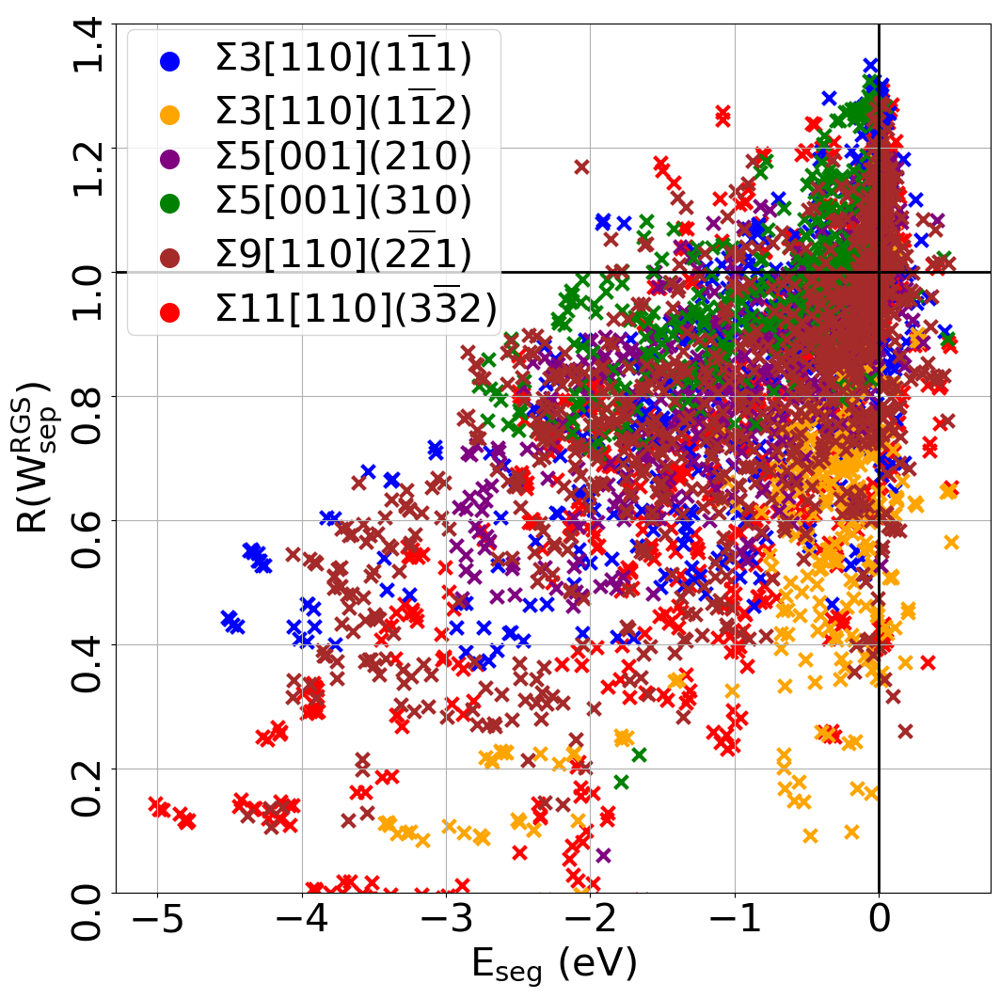

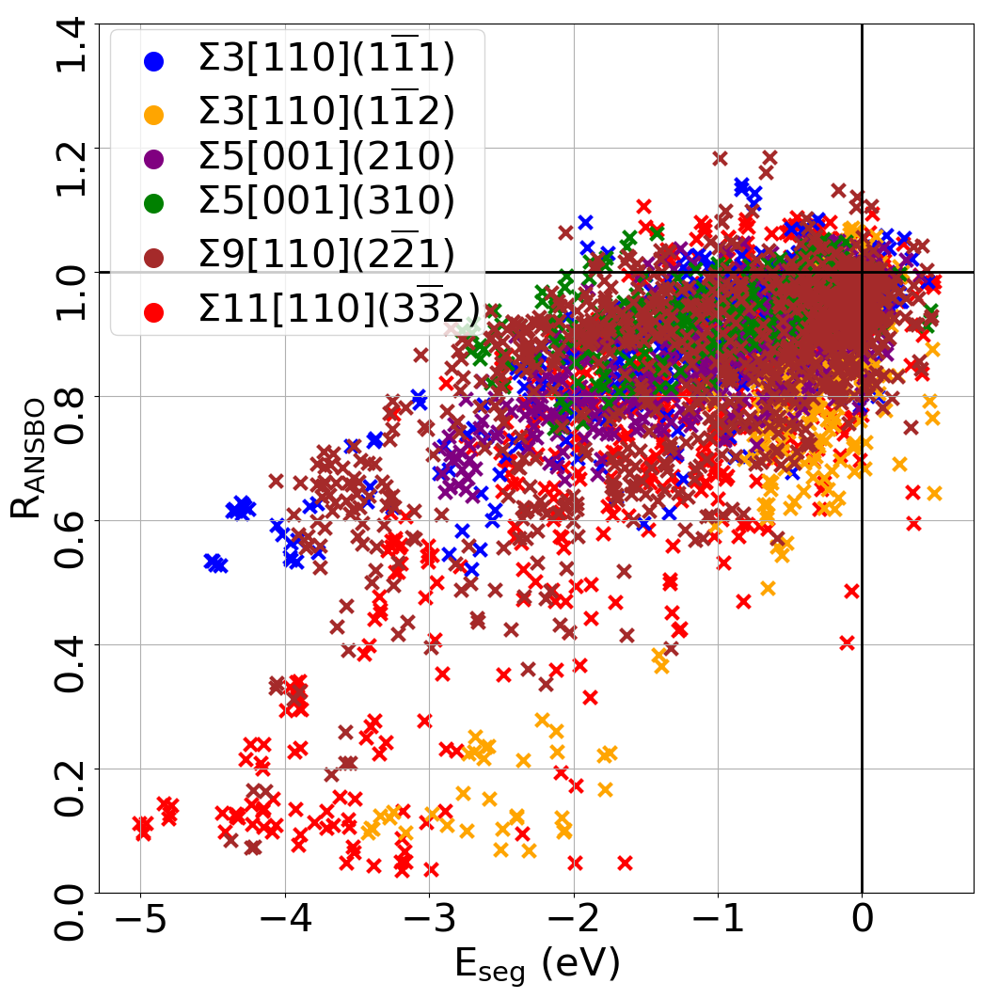

In [ ]:
from FeGB_PtableSeg.plotters import plot_prop_vs_prop

fig, ax1 = plot_prop_vs_prop(df[df["E_seg"] < 0.5],
              x_prop="E_seg",
              y_prop="R_Wsep_RGS",
              figsize=(12, 12),
              x_label = r"E$_{\rm{seg}}$ (eV)",
              x_label_fontsize=30,
              xtick_fontsize=30,
              y_label = r"R(W$_{\rm{sep}}^{\rm{RGS}}$)",
              y_label_fontsize=30,
              ytick_fontsize=30,
              legend_posn=(-0.01, 0.62),
              ylims = (0.00, 1.4))
_ = ax1.axhline(1.00, linewidth=2, linestyle="-", c="k")
_ = ax1.axvline(0, linewidth=2, linestyle="-", c="k")

fig, ax1 = plot_prop_vs_prop(df[df["E_seg"] < 0.5],
              x_prop="E_seg",
              y_prop="R_DDEC6_ANSBO",
              figsize=(12, 12),
              x_label = r"E$_{\rm{seg}}$ (eV)",
              x_label_fontsize=30,
              xtick_fontsize=30,
              y_label = r"R$_{\rm{ANSBO}}$",
              y_label_fontsize=30,
              ytick_fontsize=30,
              legend_posn=(-0.01, 0.62),
              ylims = (0.00, 1.4))
_ = ax1.axhline(1.00, linewidth=2, linestyle="-", c="k")
_ = ax1.axvline(0, linewidth=2, linestyle="-", c="k")
